# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [4]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:09<00:00, 6.05KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

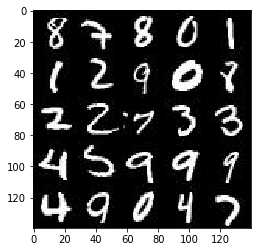

In [5]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

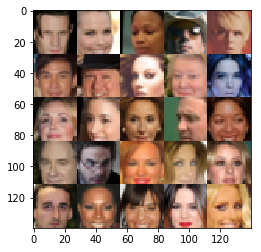

In [8]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [7]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1


/home/ed/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.
  


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [22]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    #real_dim = [image_width, image_height, image_channels]
    inputs_real = tf.placeholder(tf.float32, 
                                 shape = (None,image_width, image_height, image_channels),
                                 name = 'inputs_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='inputs_z')
    lr = tf.placeholder(tf.float32, name = 'learning_rate')
    return inputs_real, inputs_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [110]:
"""
The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.
The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.
"""


def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse = reuse):
        alpha = 0.1
        stddev = 0.025 
        # Input layer is 28x28x(1,3)
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same',
                             kernel_initializer = tf.random_normal_initializer(stddev = stddev))
        relu1 = tf.maximum(alpha*x1, x1)
        #14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides = 2, padding = 'same',
                             kernel_initializer = tf.random_normal_initializer(stddev = stddev))
        bn2 = tf.layers.batch_normalization(x2, training = True)
        relu2 = tf.maximum(alpha*bn2, bn2)
        #7*7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides = 2, padding='same',
                             kernel_initializer = tf.random_normal_initializer(stddev = stddev))
        bn3 = tf.layers.batch_normalization(x3, training = True)
        relu3 = tf.maximum(alpha*bn3, bn3)
        #4x4x256
        
        x4 = tf.layers.conv2d(relu3, 512, 3, strides=2, padding='same')
        bn4 = tf.layers.batch_normalization(x4, training= True)
        relu4 = tf.maximum(alpha*x4, x4)
        
        #Flatten the thing
        flat = tf.contrib.layers.flatten(relu4)
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [136]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    # Got tipped to use the kernel_initializer
    with tf.variable_scope('generator', reuse=not is_train):
        stddev = 0.025
        alpha = 0.01
        # First fully connected layer
        x1 = tf.layers.dense(z, 2*2*512)
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = tf.layers.batch_normalization(x1, training = is_train)
        x1 = tf.maximum(alpha*x1, x1)
        # 2x2x512

        x2 = tf.layers.conv2d_transpose(x1, 256, 3, strides = 2, padding = 'same',
                                       kernel_initializer = tf.random_normal_initializer(stddev = stddev))
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha*x2, x2)
        # 4x4x256

        x3 = tf.layers.conv2d_transpose(x2, 128, 4, strides=1, padding = 'valid',
                                       kernel_initializer = tf.random_normal_initializer(stddev = stddev))
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha*x3, x3)
        # 7x7x128
        
        x4 = tf.layers.conv2d_transpose(x3, 64, 3, strides=2, padding ='same',
                                       kernel_initializer = tf.random_normal_initializer(stddev=stddev))

        # Output layer, 28x28xout_channel
        logits = tf.layers.conv2d_transpose(x4, out_channel_dim, 5, strides = 2, padding = 'same',
                                           kernel_initializer = tf.random_normal_initializer(stddev = stddev)) 
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [137]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train= True)
    d_model_real, d_logits_real = discriminator(input_real, reuse = False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
        logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
        logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
        logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [138]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    g_updates  = [opt for opt in update_ops if opt.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(g_updates):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

        return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [139]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [144]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    _, image_width, image_height, image_channels = data_shape # Extract image parameters
    input_real, input_z, learn_rate = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    samples = []
    losses = []
    steps = 0
    print_interval = 10
    saver = tf.train.Saver()
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images = batch_images * 2
                sample_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: sample_z, learn_rate: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: sample_z, learn_rate: learning_rate}) 
            
                                
                if steps % print_interval == 0:
                    # print losses
                    train_loss_d = d_loss.eval({input_z: sample_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: sample_z})
                    print("Epoch {}/{}...".format(epoch_i + 1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                if steps % 50 == 0:
                    # show generator output to make sure that we are not generating weird images and can debug :)
                    show_generator_output(sess, 30, input_z, image_channels, data_image_mode)
                
      #removed the saver after training and generation 

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.9257... Generator Loss: 1.4867
Epoch 1/2... Discriminator Loss: 0.4625... Generator Loss: 4.5856
Epoch 1/2... Discriminator Loss: 0.2116... Generator Loss: 3.8565
Epoch 1/2... Discriminator Loss: 0.6283... Generator Loss: 8.0776
Epoch 1/2... Discriminator Loss: 0.0831... Generator Loss: 3.1846


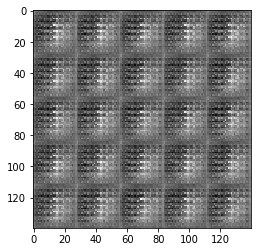

Epoch 1/2... Discriminator Loss: 0.0551... Generator Loss: 3.9697
Epoch 1/2... Discriminator Loss: 0.0984... Generator Loss: 4.1780
Epoch 1/2... Discriminator Loss: 0.0303... Generator Loss: 3.8441
Epoch 1/2... Discriminator Loss: 0.2470... Generator Loss: 1.7771
Epoch 1/2... Discriminator Loss: 0.0073... Generator Loss: 5.1694


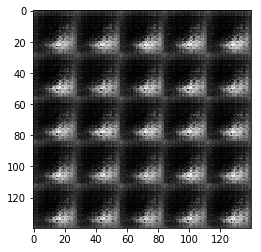

Epoch 1/2... Discriminator Loss: 0.1587... Generator Loss: 2.4039
Epoch 1/2... Discriminator Loss: 0.1447... Generator Loss: 2.4649
Epoch 1/2... Discriminator Loss: 0.0417... Generator Loss: 3.7597
Epoch 1/2... Discriminator Loss: 0.5161... Generator Loss: 0.9715
Epoch 1/2... Discriminator Loss: 0.0006... Generator Loss: 17.0463


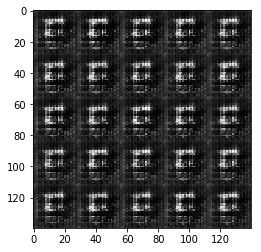

Epoch 1/2... Discriminator Loss: 0.1879... Generator Loss: 13.0732
Epoch 1/2... Discriminator Loss: 0.5768... Generator Loss: 18.7007
Epoch 1/2... Discriminator Loss: 0.1177... Generator Loss: 2.3915
Epoch 1/2... Discriminator Loss: 0.0019... Generator Loss: 8.3371
Epoch 1/2... Discriminator Loss: 0.0085... Generator Loss: 5.5550


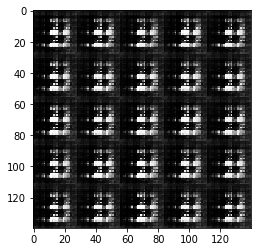

Epoch 1/2... Discriminator Loss: 0.0551... Generator Loss: 6.7335
Epoch 1/2... Discriminator Loss: 0.2864... Generator Loss: 1.4679
Epoch 1/2... Discriminator Loss: 0.0589... Generator Loss: 12.1272
Epoch 1/2... Discriminator Loss: 1.0149... Generator Loss: 14.1263
Epoch 1/2... Discriminator Loss: 0.2535... Generator Loss: 8.7342


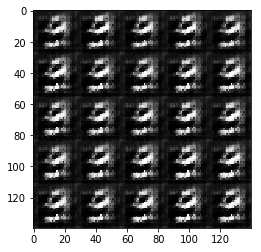

Epoch 1/2... Discriminator Loss: 0.1619... Generator Loss: 12.0983
Epoch 1/2... Discriminator Loss: 0.0991... Generator Loss: 7.0316
Epoch 1/2... Discriminator Loss: 0.0833... Generator Loss: 3.0332
Epoch 1/2... Discriminator Loss: 0.0946... Generator Loss: 3.8741
Epoch 1/2... Discriminator Loss: 0.0391... Generator Loss: 9.6722


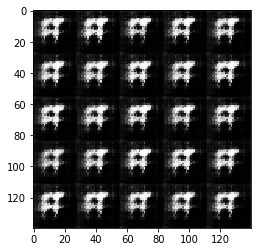

Epoch 1/2... Discriminator Loss: 0.0312... Generator Loss: 3.8510
Epoch 1/2... Discriminator Loss: 0.0300... Generator Loss: 3.8020
Epoch 1/2... Discriminator Loss: 0.0815... Generator Loss: 3.4631
Epoch 1/2... Discriminator Loss: 0.1232... Generator Loss: 2.7992
Epoch 1/2... Discriminator Loss: 0.0653... Generator Loss: 4.1597


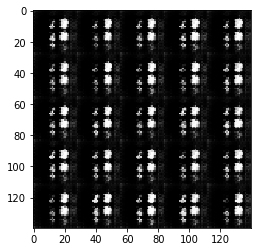

Epoch 1/2... Discriminator Loss: 0.0453... Generator Loss: 3.4093
Epoch 1/2... Discriminator Loss: 0.6076... Generator Loss: 18.1202
Epoch 1/2... Discriminator Loss: 0.0036... Generator Loss: 7.9470
Epoch 1/2... Discriminator Loss: 0.1151... Generator Loss: 13.9602
Epoch 1/2... Discriminator Loss: 0.1435... Generator Loss: 2.6046


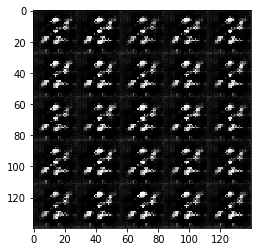

Epoch 1/2... Discriminator Loss: 0.3146... Generator Loss: 1.7672
Epoch 1/2... Discriminator Loss: 0.0699... Generator Loss: 8.7206
Epoch 1/2... Discriminator Loss: 0.0733... Generator Loss: 5.4869
Epoch 1/2... Discriminator Loss: 0.0321... Generator Loss: 5.2444
Epoch 1/2... Discriminator Loss: 0.0517... Generator Loss: 7.3201


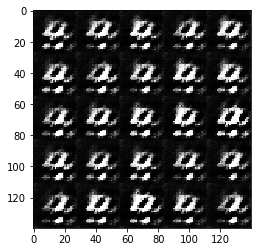

Epoch 1/2... Discriminator Loss: 0.0439... Generator Loss: 3.5023
Epoch 1/2... Discriminator Loss: 0.1323... Generator Loss: 2.5189
Epoch 1/2... Discriminator Loss: 0.0763... Generator Loss: 3.7020
Epoch 1/2... Discriminator Loss: 0.0890... Generator Loss: 11.7016
Epoch 1/2... Discriminator Loss: 0.1315... Generator Loss: 5.4593


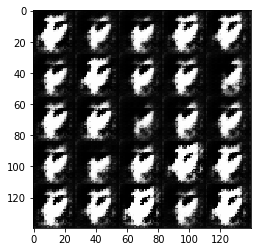

Epoch 1/2... Discriminator Loss: 0.0419... Generator Loss: 6.0857
Epoch 1/2... Discriminator Loss: 0.0580... Generator Loss: 5.4993
Epoch 1/2... Discriminator Loss: 0.0562... Generator Loss: 4.6008
Epoch 1/2... Discriminator Loss: 0.2451... Generator Loss: 2.7283
Epoch 1/2... Discriminator Loss: 0.0503... Generator Loss: 12.5334


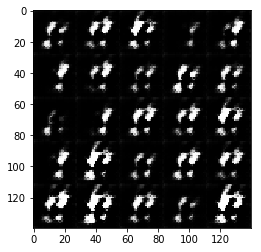

Epoch 1/2... Discriminator Loss: 0.0758... Generator Loss: 3.9122
Epoch 1/2... Discriminator Loss: 0.0860... Generator Loss: 7.6578
Epoch 1/2... Discriminator Loss: 0.1349... Generator Loss: 2.7835
Epoch 1/2... Discriminator Loss: 0.1016... Generator Loss: 3.8314
Epoch 1/2... Discriminator Loss: 0.0901... Generator Loss: 8.3120


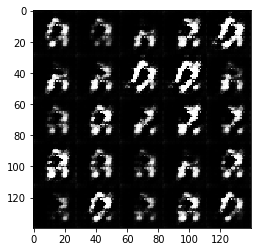

Epoch 1/2... Discriminator Loss: 0.0354... Generator Loss: 4.3494
Epoch 1/2... Discriminator Loss: 0.0649... Generator Loss: 5.0470
Epoch 1/2... Discriminator Loss: 0.0757... Generator Loss: 4.4761
Epoch 1/2... Discriminator Loss: 0.3572... Generator Loss: 5.3295
Epoch 1/2... Discriminator Loss: 0.1976... Generator Loss: 7.7935


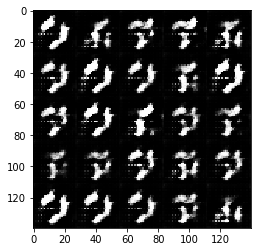

Epoch 1/2... Discriminator Loss: 0.0887... Generator Loss: 5.8972
Epoch 1/2... Discriminator Loss: 0.0039... Generator Loss: 10.1042
Epoch 1/2... Discriminator Loss: 0.1728... Generator Loss: 3.3970
Epoch 1/2... Discriminator Loss: 0.1815... Generator Loss: 6.0438
Epoch 1/2... Discriminator Loss: 0.0633... Generator Loss: 3.5085


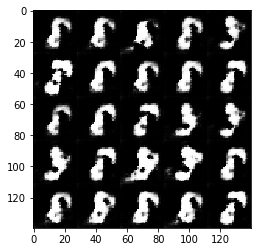

Epoch 1/2... Discriminator Loss: 0.0824... Generator Loss: 5.8657
Epoch 1/2... Discriminator Loss: 0.5506... Generator Loss: 1.5693
Epoch 1/2... Discriminator Loss: 0.1154... Generator Loss: 3.5762
Epoch 1/2... Discriminator Loss: 0.0648... Generator Loss: 5.5790
Epoch 1/2... Discriminator Loss: 0.1175... Generator Loss: 2.9545


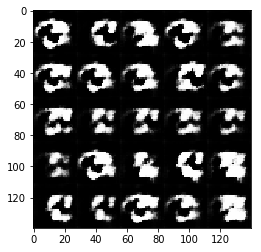

Epoch 1/2... Discriminator Loss: 1.3872... Generator Loss: 3.2270
Epoch 1/2... Discriminator Loss: 0.3649... Generator Loss: 1.9402
Epoch 1/2... Discriminator Loss: 0.0481... Generator Loss: 4.8055
Epoch 1/2... Discriminator Loss: 0.1341... Generator Loss: 2.6853
Epoch 1/2... Discriminator Loss: 0.0420... Generator Loss: 4.5531


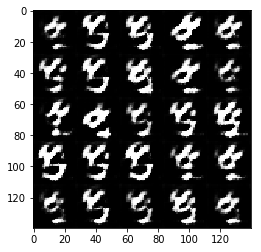

Epoch 1/2... Discriminator Loss: 0.5296... Generator Loss: 3.4427
Epoch 1/2... Discriminator Loss: 0.1125... Generator Loss: 2.9769
Epoch 1/2... Discriminator Loss: 0.4799... Generator Loss: 1.8073
Epoch 1/2... Discriminator Loss: 0.1124... Generator Loss: 3.1358
Epoch 1/2... Discriminator Loss: 0.0587... Generator Loss: 4.0504


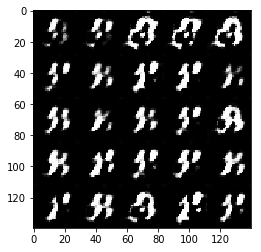

Epoch 1/2... Discriminator Loss: 0.1412... Generator Loss: 2.8981
Epoch 1/2... Discriminator Loss: 0.0841... Generator Loss: 5.7593
Epoch 1/2... Discriminator Loss: 0.1272... Generator Loss: 3.7538
Epoch 1/2... Discriminator Loss: 0.0686... Generator Loss: 8.7294
Epoch 1/2... Discriminator Loss: 0.1730... Generator Loss: 3.0934


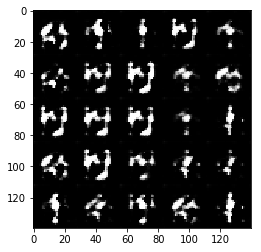

Epoch 1/2... Discriminator Loss: 0.0604... Generator Loss: 3.9309
Epoch 1/2... Discriminator Loss: 0.3873... Generator Loss: 1.9348
Epoch 1/2... Discriminator Loss: 0.2947... Generator Loss: 3.8893
Epoch 1/2... Discriminator Loss: 0.4123... Generator Loss: 10.6825
Epoch 1/2... Discriminator Loss: 0.1156... Generator Loss: 3.2548


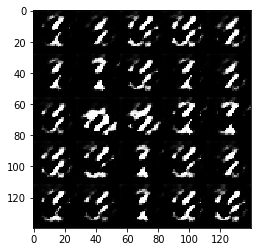

Epoch 1/2... Discriminator Loss: 0.0434... Generator Loss: 4.1608
Epoch 1/2... Discriminator Loss: 0.3929... Generator Loss: 3.2434
Epoch 1/2... Discriminator Loss: 0.0196... Generator Loss: 7.3512
Epoch 1/2... Discriminator Loss: 0.2201... Generator Loss: 2.4100
Epoch 1/2... Discriminator Loss: 0.0446... Generator Loss: 4.0151


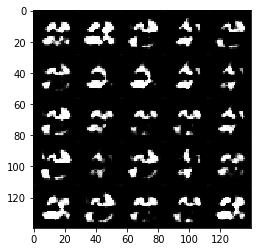

Epoch 1/2... Discriminator Loss: 0.0552... Generator Loss: 4.0731
Epoch 1/2... Discriminator Loss: 0.0530... Generator Loss: 3.7288
Epoch 1/2... Discriminator Loss: 0.0520... Generator Loss: 3.9012
Epoch 1/2... Discriminator Loss: 0.1415... Generator Loss: 3.6615
Epoch 1/2... Discriminator Loss: 0.0845... Generator Loss: 6.0566


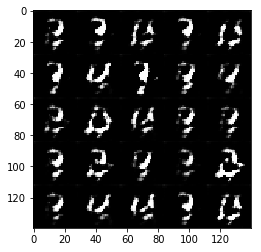

Epoch 1/2... Discriminator Loss: 0.0614... Generator Loss: 4.2169
Epoch 1/2... Discriminator Loss: 0.1098... Generator Loss: 5.5701
Epoch 1/2... Discriminator Loss: 0.3891... Generator Loss: 2.6019
Epoch 1/2... Discriminator Loss: 0.0937... Generator Loss: 4.1012
Epoch 1/2... Discriminator Loss: 0.1190... Generator Loss: 4.3795


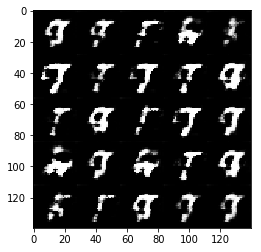

Epoch 1/2... Discriminator Loss: 0.1681... Generator Loss: 5.1389
Epoch 1/2... Discriminator Loss: 0.0888... Generator Loss: 3.7776
Epoch 1/2... Discriminator Loss: 0.1139... Generator Loss: 3.6169
Epoch 1/2... Discriminator Loss: 0.2049... Generator Loss: 2.8921
Epoch 1/2... Discriminator Loss: 0.1591... Generator Loss: 3.2312


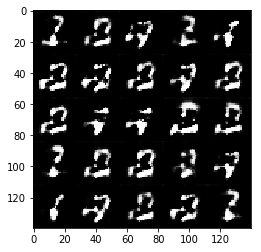

Epoch 1/2... Discriminator Loss: 0.3492... Generator Loss: 6.5454
Epoch 1/2... Discriminator Loss: 0.3666... Generator Loss: 7.0059
Epoch 1/2... Discriminator Loss: 0.2890... Generator Loss: 4.6096
Epoch 1/2... Discriminator Loss: 0.2181... Generator Loss: 3.6896
Epoch 1/2... Discriminator Loss: 0.1032... Generator Loss: 5.1668


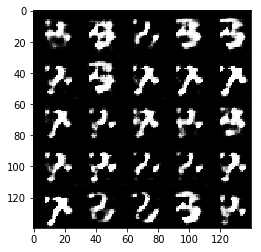

Epoch 1/2... Discriminator Loss: 0.1550... Generator Loss: 2.7971
Epoch 1/2... Discriminator Loss: 0.2961... Generator Loss: 1.7910
Epoch 1/2... Discriminator Loss: 0.1323... Generator Loss: 2.7395
Epoch 1/2... Discriminator Loss: 0.3559... Generator Loss: 1.7091
Epoch 1/2... Discriminator Loss: 0.1464... Generator Loss: 4.1775


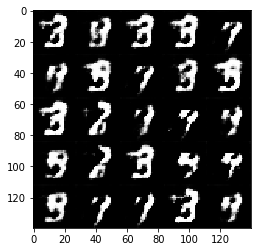

Epoch 1/2... Discriminator Loss: 0.0994... Generator Loss: 3.4012
Epoch 1/2... Discriminator Loss: 0.0674... Generator Loss: 4.2600
Epoch 1/2... Discriminator Loss: 0.2596... Generator Loss: 6.0814
Epoch 1/2... Discriminator Loss: 0.0534... Generator Loss: 4.9097
Epoch 1/2... Discriminator Loss: 0.1001... Generator Loss: 4.2860


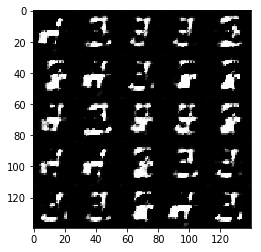

Epoch 1/2... Discriminator Loss: 0.0513... Generator Loss: 3.9741
Epoch 1/2... Discriminator Loss: 0.0548... Generator Loss: 4.5609
Epoch 1/2... Discriminator Loss: 0.0810... Generator Loss: 3.2510
Epoch 1/2... Discriminator Loss: 0.1076... Generator Loss: 5.2193
Epoch 1/2... Discriminator Loss: 1.8592... Generator Loss: 14.2611


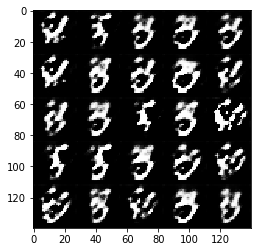

Epoch 1/2... Discriminator Loss: 0.3065... Generator Loss: 2.4947
Epoch 1/2... Discriminator Loss: 0.0730... Generator Loss: 5.1533
Epoch 1/2... Discriminator Loss: 0.2171... Generator Loss: 2.1894
Epoch 1/2... Discriminator Loss: 0.2172... Generator Loss: 3.4272
Epoch 1/2... Discriminator Loss: 0.1873... Generator Loss: 3.9872


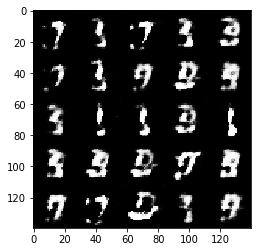

Epoch 1/2... Discriminator Loss: 0.1337... Generator Loss: 2.9893
Epoch 1/2... Discriminator Loss: 0.2122... Generator Loss: 2.3986
Epoch 1/2... Discriminator Loss: 0.1223... Generator Loss: 3.1131
Epoch 1/2... Discriminator Loss: 0.1745... Generator Loss: 3.0668
Epoch 1/2... Discriminator Loss: 0.0755... Generator Loss: 5.3449


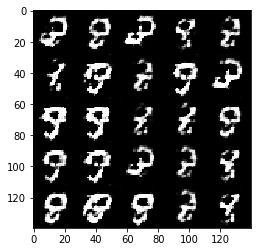

Epoch 1/2... Discriminator Loss: 0.0725... Generator Loss: 4.5670
Epoch 1/2... Discriminator Loss: 0.7700... Generator Loss: 2.5386
Epoch 1/2... Discriminator Loss: 0.0606... Generator Loss: 5.2459
Epoch 1/2... Discriminator Loss: 0.4703... Generator Loss: 2.7534
Epoch 1/2... Discriminator Loss: 0.1648... Generator Loss: 5.9678


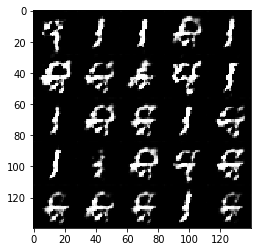

Epoch 1/2... Discriminator Loss: 0.1492... Generator Loss: 4.8599
Epoch 1/2... Discriminator Loss: 0.0275... Generator Loss: 6.9104
Epoch 1/2... Discriminator Loss: 0.0436... Generator Loss: 5.4471
Epoch 1/2... Discriminator Loss: 0.0527... Generator Loss: 5.1007
Epoch 1/2... Discriminator Loss: 5.6785... Generator Loss: 18.3000


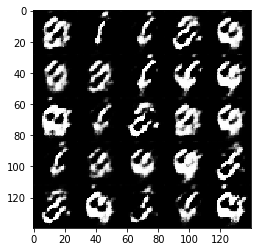

Epoch 1/2... Discriminator Loss: 0.4060... Generator Loss: 2.9251
Epoch 1/2... Discriminator Loss: 0.1979... Generator Loss: 3.4294
Epoch 1/2... Discriminator Loss: 0.6932... Generator Loss: 1.1982
Epoch 1/2... Discriminator Loss: 0.1214... Generator Loss: 3.6709
Epoch 1/2... Discriminator Loss: 0.1243... Generator Loss: 3.3200


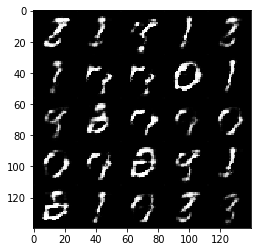

Epoch 1/2... Discriminator Loss: 0.1478... Generator Loss: 4.2369
Epoch 1/2... Discriminator Loss: 0.1899... Generator Loss: 2.9830
Epoch 1/2... Discriminator Loss: 0.2201... Generator Loss: 2.2239
Epoch 1/2... Discriminator Loss: 0.0795... Generator Loss: 3.7486
Epoch 1/2... Discriminator Loss: 1.0674... Generator Loss: 1.9571


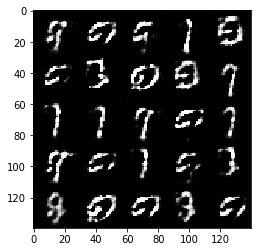

Epoch 1/2... Discriminator Loss: 0.2906... Generator Loss: 2.8101
Epoch 1/2... Discriminator Loss: 0.2203... Generator Loss: 3.5963
Epoch 1/2... Discriminator Loss: 0.0844... Generator Loss: 3.7063
Epoch 1/2... Discriminator Loss: 0.1631... Generator Loss: 3.0297
Epoch 1/2... Discriminator Loss: 0.1255... Generator Loss: 4.6199


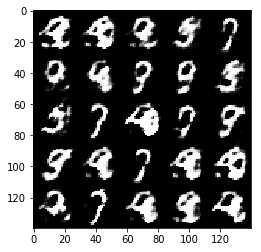

Epoch 1/2... Discriminator Loss: 0.1419... Generator Loss: 2.9217
Epoch 1/2... Discriminator Loss: 0.1003... Generator Loss: 3.2118
Epoch 1/2... Discriminator Loss: 0.1933... Generator Loss: 4.1618
Epoch 1/2... Discriminator Loss: 0.1274... Generator Loss: 3.1629
Epoch 1/2... Discriminator Loss: 0.1704... Generator Loss: 7.3238


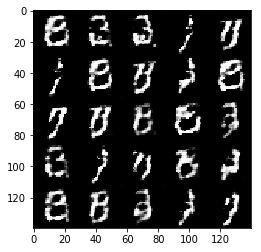

Epoch 1/2... Discriminator Loss: 0.1632... Generator Loss: 2.8797
Epoch 1/2... Discriminator Loss: 1.2421... Generator Loss: 0.6711
Epoch 1/2... Discriminator Loss: 0.3612... Generator Loss: 1.8882
Epoch 1/2... Discriminator Loss: 0.1398... Generator Loss: 2.7806
Epoch 1/2... Discriminator Loss: 0.1958... Generator Loss: 3.1430


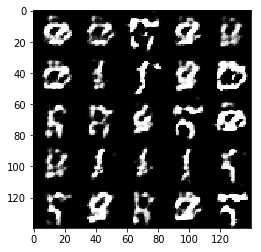

Epoch 1/2... Discriminator Loss: 0.1183... Generator Loss: 3.2067
Epoch 1/2... Discriminator Loss: 0.0796... Generator Loss: 5.3753
Epoch 1/2... Discriminator Loss: 0.1144... Generator Loss: 3.1770
Epoch 1/2... Discriminator Loss: 0.0674... Generator Loss: 3.9760
Epoch 1/2... Discriminator Loss: 0.0718... Generator Loss: 4.1428


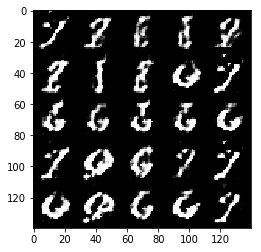

Epoch 1/2... Discriminator Loss: 0.0777... Generator Loss: 3.5072
Epoch 1/2... Discriminator Loss: 0.1021... Generator Loss: 2.9617
Epoch 2/2... Discriminator Loss: 0.3352... Generator Loss: 2.1982
Epoch 2/2... Discriminator Loss: 0.2093... Generator Loss: 2.6462
Epoch 2/2... Discriminator Loss: 0.2799... Generator Loss: 2.2598


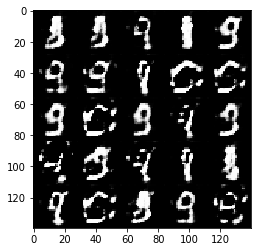

Epoch 2/2... Discriminator Loss: 0.0758... Generator Loss: 7.1614
Epoch 2/2... Discriminator Loss: 0.1355... Generator Loss: 2.8820
Epoch 2/2... Discriminator Loss: 0.1176... Generator Loss: 3.8423
Epoch 2/2... Discriminator Loss: 0.1538... Generator Loss: 3.0795
Epoch 2/2... Discriminator Loss: 0.1855... Generator Loss: 2.6895


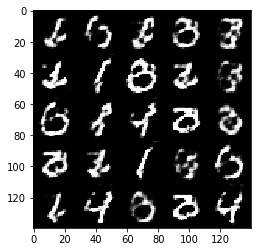

Epoch 2/2... Discriminator Loss: 0.1392... Generator Loss: 3.1922
Epoch 2/2... Discriminator Loss: 0.1537... Generator Loss: 3.1468
Epoch 2/2... Discriminator Loss: 0.2059... Generator Loss: 2.4933
Epoch 2/2... Discriminator Loss: 0.2308... Generator Loss: 6.6229
Epoch 2/2... Discriminator Loss: 0.3219... Generator Loss: 5.1499


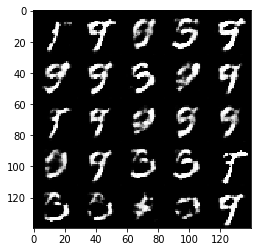

Epoch 2/2... Discriminator Loss: 0.2641... Generator Loss: 2.5101
Epoch 2/2... Discriminator Loss: 0.1218... Generator Loss: 3.2394
Epoch 2/2... Discriminator Loss: 0.2602... Generator Loss: 2.5671
Epoch 2/2... Discriminator Loss: 0.5836... Generator Loss: 1.5685
Epoch 2/2... Discriminator Loss: 0.2684... Generator Loss: 3.5592


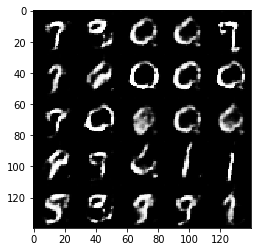

Epoch 2/2... Discriminator Loss: 0.3177... Generator Loss: 1.9383
Epoch 2/2... Discriminator Loss: 0.2143... Generator Loss: 4.1959
Epoch 2/2... Discriminator Loss: 0.2029... Generator Loss: 2.8062
Epoch 2/2... Discriminator Loss: 0.1631... Generator Loss: 3.0915
Epoch 2/2... Discriminator Loss: 0.0952... Generator Loss: 4.2832


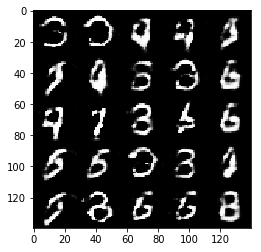

Epoch 2/2... Discriminator Loss: 0.1885... Generator Loss: 2.5438
Epoch 2/2... Discriminator Loss: 0.2299... Generator Loss: 2.4997
Epoch 2/2... Discriminator Loss: 0.1201... Generator Loss: 4.1687
Epoch 2/2... Discriminator Loss: 0.4022... Generator Loss: 2.0758
Epoch 2/2... Discriminator Loss: 0.1035... Generator Loss: 3.6752


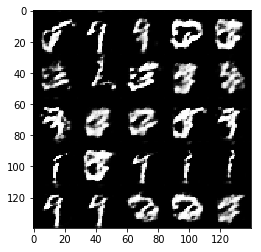

Epoch 2/2... Discriminator Loss: 0.2647... Generator Loss: 2.3938
Epoch 2/2... Discriminator Loss: 0.4123... Generator Loss: 2.4586
Epoch 2/2... Discriminator Loss: 0.4020... Generator Loss: 3.5895
Epoch 2/2... Discriminator Loss: 0.1351... Generator Loss: 3.0657
Epoch 2/2... Discriminator Loss: 0.2740... Generator Loss: 2.2220


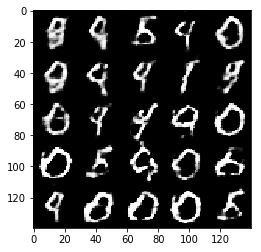

Epoch 2/2... Discriminator Loss: 0.4469... Generator Loss: 1.5523
Epoch 2/2... Discriminator Loss: 0.3613... Generator Loss: 1.8973
Epoch 2/2... Discriminator Loss: 0.4277... Generator Loss: 1.4011
Epoch 2/2... Discriminator Loss: 0.3094... Generator Loss: 2.1336
Epoch 2/2... Discriminator Loss: 0.1502... Generator Loss: 3.3097


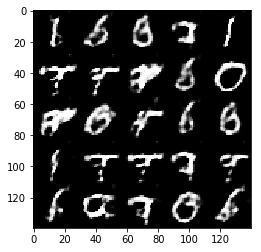

Epoch 2/2... Discriminator Loss: 0.2714... Generator Loss: 2.1119
Epoch 2/2... Discriminator Loss: 0.4965... Generator Loss: 1.6855
Epoch 2/2... Discriminator Loss: 0.7849... Generator Loss: 5.7922
Epoch 2/2... Discriminator Loss: 0.2283... Generator Loss: 4.2682
Epoch 2/2... Discriminator Loss: 0.1936... Generator Loss: 2.4462


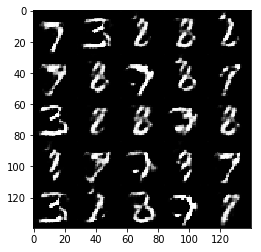

Epoch 2/2... Discriminator Loss: 0.1351... Generator Loss: 4.5636
Epoch 2/2... Discriminator Loss: 0.3482... Generator Loss: 3.2660
Epoch 2/2... Discriminator Loss: 0.1848... Generator Loss: 2.8495
Epoch 2/2... Discriminator Loss: 0.3195... Generator Loss: 2.4084
Epoch 2/2... Discriminator Loss: 0.1569... Generator Loss: 4.9336


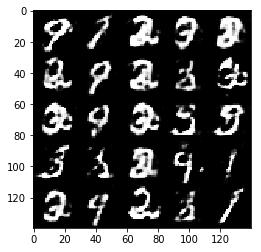

Epoch 2/2... Discriminator Loss: 0.1171... Generator Loss: 3.8682
Epoch 2/2... Discriminator Loss: 0.1873... Generator Loss: 3.0094
Epoch 2/2... Discriminator Loss: 1.3248... Generator Loss: 1.1093
Epoch 2/2... Discriminator Loss: 0.1745... Generator Loss: 4.1962
Epoch 2/2... Discriminator Loss: 0.1782... Generator Loss: 7.9295


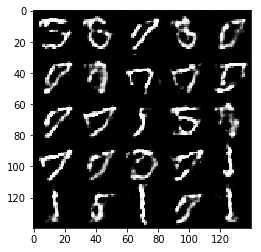

Epoch 2/2... Discriminator Loss: 0.0877... Generator Loss: 3.4668
Epoch 2/2... Discriminator Loss: 0.1359... Generator Loss: 3.3815
Epoch 2/2... Discriminator Loss: 0.0716... Generator Loss: 3.8761
Epoch 2/2... Discriminator Loss: 0.4891... Generator Loss: 1.8284
Epoch 2/2... Discriminator Loss: 0.5351... Generator Loss: 1.7048


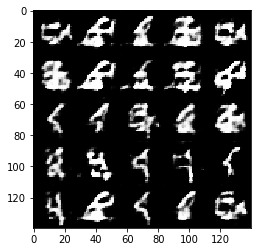

Epoch 2/2... Discriminator Loss: 0.0637... Generator Loss: 3.7044
Epoch 2/2... Discriminator Loss: 0.1169... Generator Loss: 3.6357
Epoch 2/2... Discriminator Loss: 0.0670... Generator Loss: 4.5331
Epoch 2/2... Discriminator Loss: 1.5144... Generator Loss: 11.9085
Epoch 2/2... Discriminator Loss: 0.0831... Generator Loss: 4.3237


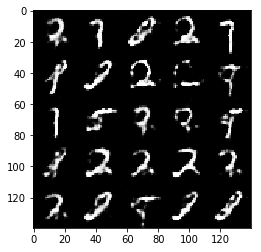

Epoch 2/2... Discriminator Loss: 0.2315... Generator Loss: 9.9674
Epoch 2/2... Discriminator Loss: 0.1015... Generator Loss: 4.1825
Epoch 2/2... Discriminator Loss: 0.1351... Generator Loss: 3.8852
Epoch 2/2... Discriminator Loss: 0.0850... Generator Loss: 4.4841
Epoch 2/2... Discriminator Loss: 0.3854... Generator Loss: 2.5490


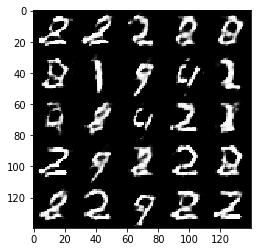

Epoch 2/2... Discriminator Loss: 0.1173... Generator Loss: 3.8100
Epoch 2/2... Discriminator Loss: 0.3251... Generator Loss: 4.0629
Epoch 2/2... Discriminator Loss: 0.1154... Generator Loss: 3.0431
Epoch 2/2... Discriminator Loss: 0.1390... Generator Loss: 3.8993
Epoch 2/2... Discriminator Loss: 0.1021... Generator Loss: 3.7876


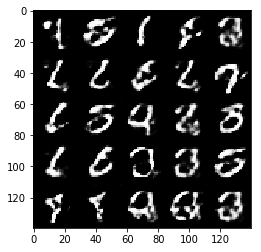

Epoch 2/2... Discriminator Loss: 0.1404... Generator Loss: 3.8511
Epoch 2/2... Discriminator Loss: 0.1101... Generator Loss: 3.5051
Epoch 2/2... Discriminator Loss: 0.2386... Generator Loss: 3.8006
Epoch 2/2... Discriminator Loss: 0.3032... Generator Loss: 2.0138
Epoch 2/2... Discriminator Loss: 0.0731... Generator Loss: 4.1701


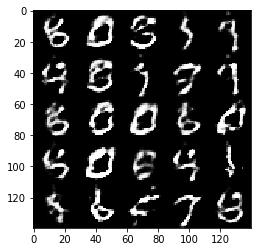

Epoch 2/2... Discriminator Loss: 0.4497... Generator Loss: 3.4723
Epoch 2/2... Discriminator Loss: 0.5168... Generator Loss: 1.5510
Epoch 2/2... Discriminator Loss: 0.3190... Generator Loss: 2.2748
Epoch 2/2... Discriminator Loss: 0.5235... Generator Loss: 1.6545
Epoch 2/2... Discriminator Loss: 0.0513... Generator Loss: 6.8526


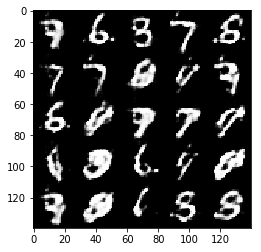

Epoch 2/2... Discriminator Loss: 0.2557... Generator Loss: 2.7073
Epoch 2/2... Discriminator Loss: 0.5477... Generator Loss: 2.3007
Epoch 2/2... Discriminator Loss: 0.2942... Generator Loss: 1.8176
Epoch 2/2... Discriminator Loss: 0.2068... Generator Loss: 3.3969
Epoch 2/2... Discriminator Loss: 0.1236... Generator Loss: 3.4917


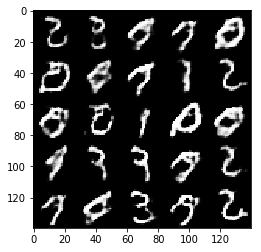

Epoch 2/2... Discriminator Loss: 0.0980... Generator Loss: 4.1504
Epoch 2/2... Discriminator Loss: 0.2751... Generator Loss: 3.7084
Epoch 2/2... Discriminator Loss: 0.4296... Generator Loss: 1.7813
Epoch 2/2... Discriminator Loss: 0.2288... Generator Loss: 3.1191
Epoch 2/2... Discriminator Loss: 0.1330... Generator Loss: 3.0223


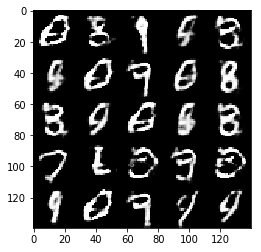

Epoch 2/2... Discriminator Loss: 0.4850... Generator Loss: 7.9012
Epoch 2/2... Discriminator Loss: 0.3683... Generator Loss: 2.4283
Epoch 2/2... Discriminator Loss: 0.2355... Generator Loss: 2.6028
Epoch 2/2... Discriminator Loss: 0.0598... Generator Loss: 4.0697
Epoch 2/2... Discriminator Loss: 0.0934... Generator Loss: 4.4164


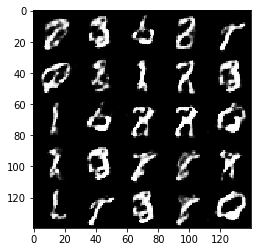

Epoch 2/2... Discriminator Loss: 0.1221... Generator Loss: 2.9990
Epoch 2/2... Discriminator Loss: 0.0925... Generator Loss: 3.2996
Epoch 2/2... Discriminator Loss: 0.0503... Generator Loss: 5.2444
Epoch 2/2... Discriminator Loss: 0.0651... Generator Loss: 5.1860
Epoch 2/2... Discriminator Loss: 0.1335... Generator Loss: 3.1932


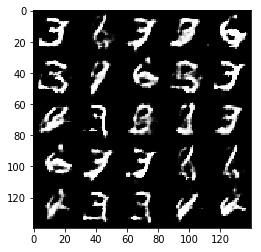

Epoch 2/2... Discriminator Loss: 0.0803... Generator Loss: 4.2877
Epoch 2/2... Discriminator Loss: 0.0322... Generator Loss: 6.7662
Epoch 2/2... Discriminator Loss: 0.1506... Generator Loss: 3.1715
Epoch 2/2... Discriminator Loss: 0.1874... Generator Loss: 3.1447
Epoch 2/2... Discriminator Loss: 0.1523... Generator Loss: 5.0743


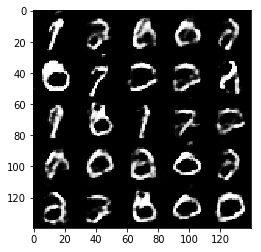

Epoch 2/2... Discriminator Loss: 0.2975... Generator Loss: 2.5632
Epoch 2/2... Discriminator Loss: 0.1051... Generator Loss: 4.3544
Epoch 2/2... Discriminator Loss: 0.4853... Generator Loss: 1.6750
Epoch 2/2... Discriminator Loss: 0.0951... Generator Loss: 3.0870
Epoch 2/2... Discriminator Loss: 0.2695... Generator Loss: 2.4014


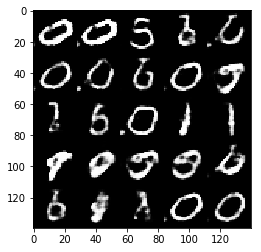

Epoch 2/2... Discriminator Loss: 0.0563... Generator Loss: 4.3839
Epoch 2/2... Discriminator Loss: 0.5225... Generator Loss: 1.4628
Epoch 2/2... Discriminator Loss: 0.2340... Generator Loss: 2.4368
Epoch 2/2... Discriminator Loss: 0.2764... Generator Loss: 4.8692
Epoch 2/2... Discriminator Loss: 0.0878... Generator Loss: 4.1802


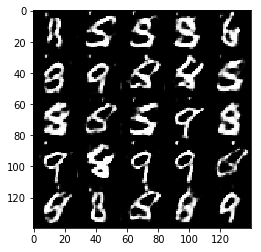

Epoch 2/2... Discriminator Loss: 0.0400... Generator Loss: 4.1434
Epoch 2/2... Discriminator Loss: 0.1502... Generator Loss: 3.6225
Epoch 2/2... Discriminator Loss: 0.0779... Generator Loss: 6.4549
Epoch 2/2... Discriminator Loss: 0.2262... Generator Loss: 3.0611
Epoch 2/2... Discriminator Loss: 0.9670... Generator Loss: 0.9684


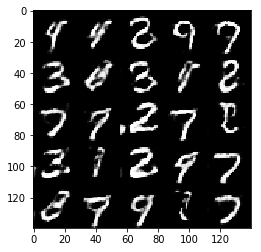

Epoch 2/2... Discriminator Loss: 0.1346... Generator Loss: 2.9554
Epoch 2/2... Discriminator Loss: 0.1729... Generator Loss: 3.0872
Epoch 2/2... Discriminator Loss: 0.1073... Generator Loss: 3.5935
Epoch 2/2... Discriminator Loss: 0.1065... Generator Loss: 3.8721
Epoch 2/2... Discriminator Loss: 0.0712... Generator Loss: 3.9567


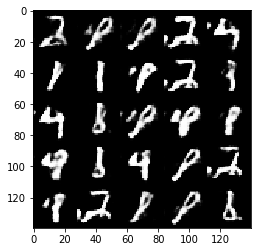

Epoch 2/2... Discriminator Loss: 0.0909... Generator Loss: 3.8781
Epoch 2/2... Discriminator Loss: 0.2721... Generator Loss: 2.9000
Epoch 2/2... Discriminator Loss: 0.0923... Generator Loss: 3.9228
Epoch 2/2... Discriminator Loss: 0.3943... Generator Loss: 5.3868
Epoch 2/2... Discriminator Loss: 1.2460... Generator Loss: 1.0420


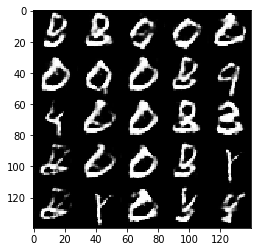

Epoch 2/2... Discriminator Loss: 0.1579... Generator Loss: 3.1166
Epoch 2/2... Discriminator Loss: 1.2979... Generator Loss: 11.5539
Epoch 2/2... Discriminator Loss: 0.3433... Generator Loss: 2.5155
Epoch 2/2... Discriminator Loss: 0.4543... Generator Loss: 1.7966
Epoch 2/2... Discriminator Loss: 0.1509... Generator Loss: 2.8977


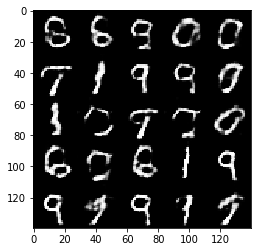

Epoch 2/2... Discriminator Loss: 0.2150... Generator Loss: 3.6364
Epoch 2/2... Discriminator Loss: 0.1758... Generator Loss: 3.2747
Epoch 2/2... Discriminator Loss: 0.5224... Generator Loss: 2.7419
Epoch 2/2... Discriminator Loss: 0.1477... Generator Loss: 3.0575
Epoch 2/2... Discriminator Loss: 0.0919... Generator Loss: 3.4952


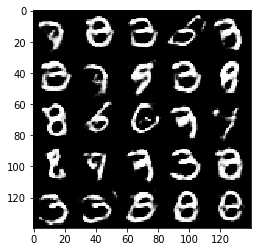

Epoch 2/2... Discriminator Loss: 0.2239... Generator Loss: 3.5687
Epoch 2/2... Discriminator Loss: 0.2571... Generator Loss: 7.2228
Epoch 2/2... Discriminator Loss: 0.2241... Generator Loss: 2.5573
Epoch 2/2... Discriminator Loss: 0.1109... Generator Loss: 4.1298
Epoch 2/2... Discriminator Loss: 0.0450... Generator Loss: 4.3471


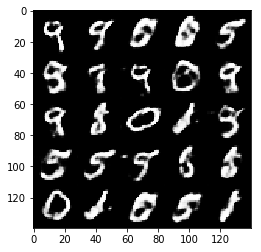

Epoch 2/2... Discriminator Loss: 0.3009... Generator Loss: 2.2255
Epoch 2/2... Discriminator Loss: 0.1486... Generator Loss: 3.5048
Epoch 2/2... Discriminator Loss: 0.1755... Generator Loss: 2.8303
Epoch 2/2... Discriminator Loss: 0.2938... Generator Loss: 4.9646
Epoch 2/2... Discriminator Loss: 0.1151... Generator Loss: 3.5287


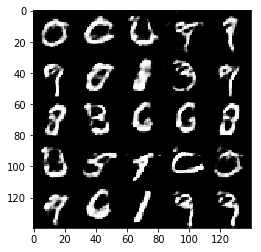

Epoch 2/2... Discriminator Loss: 0.2014... Generator Loss: 2.7425
Epoch 2/2... Discriminator Loss: 1.1567... Generator Loss: 9.0207
Epoch 2/2... Discriminator Loss: 0.2973... Generator Loss: 2.3534
Epoch 2/2... Discriminator Loss: 0.1893... Generator Loss: 3.9787
Epoch 2/2... Discriminator Loss: 0.1537... Generator Loss: 3.2003


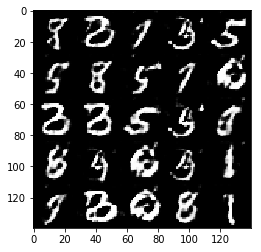

Epoch 2/2... Discriminator Loss: 0.3810... Generator Loss: 1.9811
Epoch 2/2... Discriminator Loss: 0.2234... Generator Loss: 2.8052
Epoch 2/2... Discriminator Loss: 0.2468... Generator Loss: 3.5193
Epoch 2/2... Discriminator Loss: 0.2089... Generator Loss: 3.6145
Epoch 2/2... Discriminator Loss: 0.3034... Generator Loss: 2.8255


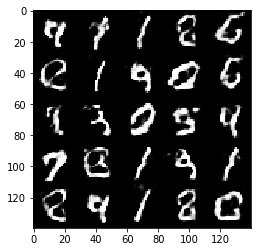

Epoch 2/2... Discriminator Loss: 0.4533... Generator Loss: 1.9557
Epoch 2/2... Discriminator Loss: 0.2134... Generator Loss: 2.7609
Epoch 2/2... Discriminator Loss: 0.2008... Generator Loss: 2.9209
Epoch 2/2... Discriminator Loss: 0.5893... Generator Loss: 1.3257
Epoch 2/2... Discriminator Loss: 0.2727... Generator Loss: 2.3280


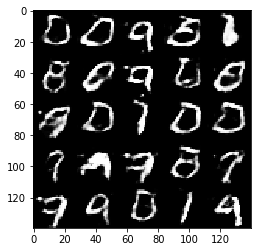

Epoch 2/2... Discriminator Loss: 0.2807... Generator Loss: 2.5573
Epoch 2/2... Discriminator Loss: 0.4827... Generator Loss: 1.5173
Epoch 2/2... Discriminator Loss: 0.1722... Generator Loss: 2.7624
Epoch 2/2... Discriminator Loss: 0.9016... Generator Loss: 1.0742
Epoch 2/2... Discriminator Loss: 0.3018... Generator Loss: 2.4009


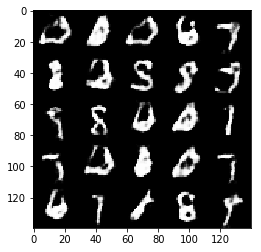

Epoch 2/2... Discriminator Loss: 0.1893... Generator Loss: 3.0220
Epoch 2/2... Discriminator Loss: 0.2010... Generator Loss: 3.4646
Epoch 2/2... Discriminator Loss: 0.2238... Generator Loss: 2.5774
Epoch 2/2... Discriminator Loss: 0.1583... Generator Loss: 2.9609
Epoch 2/2... Discriminator Loss: 0.1390... Generator Loss: 3.6844


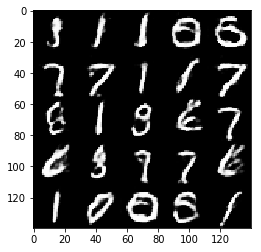

Epoch 2/2... Discriminator Loss: 0.3676... Generator Loss: 2.1725
Epoch 2/2... Discriminator Loss: 0.1078... Generator Loss: 4.1616
Epoch 2/2... Discriminator Loss: 0.2673... Generator Loss: 2.6745
Epoch 2/2... Discriminator Loss: 0.1691... Generator Loss: 2.5776
Epoch 2/2... Discriminator Loss: 0.1375... Generator Loss: 3.4324


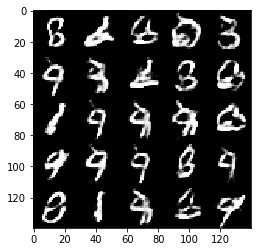

Epoch 2/2... Discriminator Loss: 0.2316... Generator Loss: 5.4450
Epoch 2/2... Discriminator Loss: 0.1067... Generator Loss: 3.7130
Epoch 2/2... Discriminator Loss: 0.1028... Generator Loss: 5.3629
Epoch 2/2... Discriminator Loss: 0.3215... Generator Loss: 2.4106
Epoch 2/2... Discriminator Loss: 0.0473... Generator Loss: 7.6111


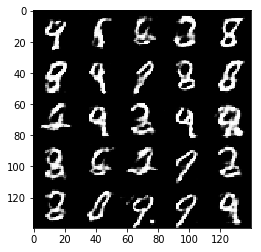

ValueError: Parent directory of ./ckpts/generator.ckpt doesn't exist, can't save.

In [141]:
batch_size = 32
z_dim = 100
learning_rate = 0.00025
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.2607... Generator Loss: 4.2219
Epoch 1/1... Discriminator Loss: 2.4968... Generator Loss: 8.0281
Epoch 1/1... Discriminator Loss: 0.0920... Generator Loss: 3.6543
Epoch 1/1... Discriminator Loss: 0.7392... Generator Loss: 1.2602
Epoch 1/1... Discriminator Loss: 1.4973... Generator Loss: 8.2453


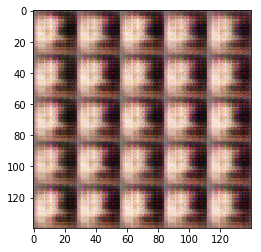

Epoch 1/1... Discriminator Loss: 0.4543... Generator Loss: 4.9139
Epoch 1/1... Discriminator Loss: 0.8939... Generator Loss: 6.5828
Epoch 1/1... Discriminator Loss: 0.6317... Generator Loss: 1.8909
Epoch 1/1... Discriminator Loss: 0.7031... Generator Loss: 0.8657
Epoch 1/1... Discriminator Loss: 0.9930... Generator Loss: 0.6290


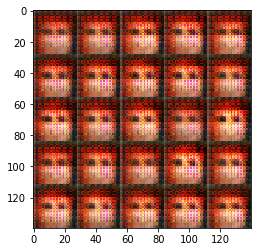

Epoch 1/1... Discriminator Loss: 0.5490... Generator Loss: 2.2011
Epoch 1/1... Discriminator Loss: 0.3737... Generator Loss: 1.9479
Epoch 1/1... Discriminator Loss: 1.9262... Generator Loss: 0.2473
Epoch 1/1... Discriminator Loss: 0.8532... Generator Loss: 1.0125
Epoch 1/1... Discriminator Loss: 0.6821... Generator Loss: 2.1577


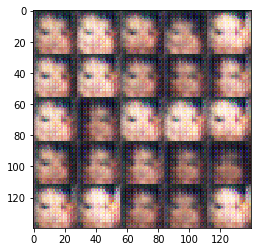

Epoch 1/1... Discriminator Loss: 0.7303... Generator Loss: 1.2818
Epoch 1/1... Discriminator Loss: 0.5834... Generator Loss: 2.4967
Epoch 1/1... Discriminator Loss: 0.3470... Generator Loss: 2.6331
Epoch 1/1... Discriminator Loss: 1.0082... Generator Loss: 1.4239
Epoch 1/1... Discriminator Loss: 0.7569... Generator Loss: 1.4120


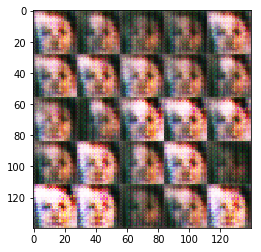

Epoch 1/1... Discriminator Loss: 1.1070... Generator Loss: 0.8176
Epoch 1/1... Discriminator Loss: 0.4835... Generator Loss: 2.1387
Epoch 1/1... Discriminator Loss: 0.8779... Generator Loss: 1.0519
Epoch 1/1... Discriminator Loss: 0.4563... Generator Loss: 1.7691
Epoch 1/1... Discriminator Loss: 0.3543... Generator Loss: 1.6806


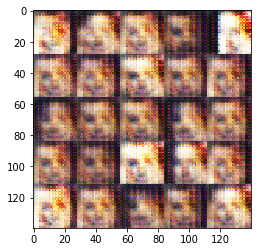

Epoch 1/1... Discriminator Loss: 0.3886... Generator Loss: 1.8635
Epoch 1/1... Discriminator Loss: 1.0628... Generator Loss: 0.8286
Epoch 1/1... Discriminator Loss: 1.7212... Generator Loss: 5.9156
Epoch 1/1... Discriminator Loss: 0.7199... Generator Loss: 3.9456
Epoch 1/1... Discriminator Loss: 0.9246... Generator Loss: 0.9802


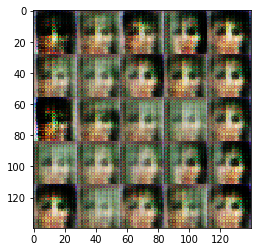

Epoch 1/1... Discriminator Loss: 1.6762... Generator Loss: 3.3803
Epoch 1/1... Discriminator Loss: 0.6974... Generator Loss: 1.9777
Epoch 1/1... Discriminator Loss: 1.2862... Generator Loss: 1.7540
Epoch 1/1... Discriminator Loss: 1.5078... Generator Loss: 3.2950
Epoch 1/1... Discriminator Loss: 1.3313... Generator Loss: 1.7476


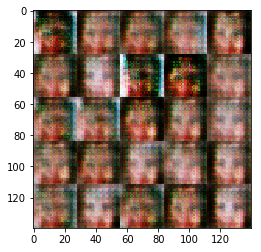

Epoch 1/1... Discriminator Loss: 1.5720... Generator Loss: 0.4101
Epoch 1/1... Discriminator Loss: 1.3877... Generator Loss: 0.8353
Epoch 1/1... Discriminator Loss: 0.7952... Generator Loss: 1.4888
Epoch 1/1... Discriminator Loss: 1.1133... Generator Loss: 0.7246
Epoch 1/1... Discriminator Loss: 2.0622... Generator Loss: 0.2162


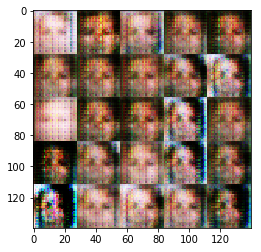

Epoch 1/1... Discriminator Loss: 0.7810... Generator Loss: 1.3418
Epoch 1/1... Discriminator Loss: 1.0243... Generator Loss: 0.6002
Epoch 1/1... Discriminator Loss: 1.0155... Generator Loss: 0.7261
Epoch 1/1... Discriminator Loss: 0.7957... Generator Loss: 1.8857
Epoch 1/1... Discriminator Loss: 1.5750... Generator Loss: 0.4081


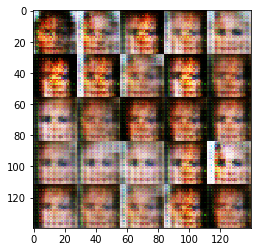

Epoch 1/1... Discriminator Loss: 1.0299... Generator Loss: 0.7577
Epoch 1/1... Discriminator Loss: 0.8296... Generator Loss: 1.3761
Epoch 1/1... Discriminator Loss: 0.6770... Generator Loss: 1.8365
Epoch 1/1... Discriminator Loss: 0.8878... Generator Loss: 0.9350
Epoch 1/1... Discriminator Loss: 0.6693... Generator Loss: 1.7029


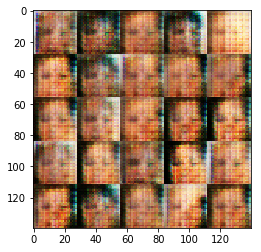

Epoch 1/1... Discriminator Loss: 0.5163... Generator Loss: 1.3492
Epoch 1/1... Discriminator Loss: 0.9272... Generator Loss: 0.8892
Epoch 1/1... Discriminator Loss: 0.8122... Generator Loss: 1.3277
Epoch 1/1... Discriminator Loss: 0.8194... Generator Loss: 1.0235
Epoch 1/1... Discriminator Loss: 0.8608... Generator Loss: 0.8706


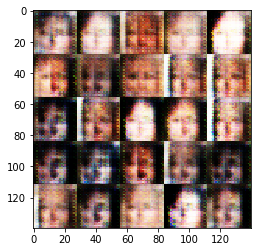

Epoch 1/1... Discriminator Loss: 1.0804... Generator Loss: 1.0075
Epoch 1/1... Discriminator Loss: 1.2799... Generator Loss: 0.6852
Epoch 1/1... Discriminator Loss: 0.7313... Generator Loss: 2.8638
Epoch 1/1... Discriminator Loss: 0.5373... Generator Loss: 1.8923
Epoch 1/1... Discriminator Loss: 0.8042... Generator Loss: 1.3028


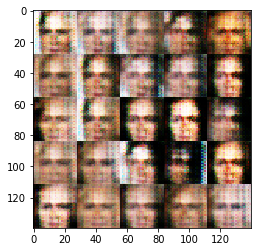

Epoch 1/1... Discriminator Loss: 0.5821... Generator Loss: 1.5387
Epoch 1/1... Discriminator Loss: 0.9074... Generator Loss: 1.3693
Epoch 1/1... Discriminator Loss: 1.6035... Generator Loss: 0.3366
Epoch 1/1... Discriminator Loss: 0.7042... Generator Loss: 1.5967
Epoch 1/1... Discriminator Loss: 1.3790... Generator Loss: 0.6860


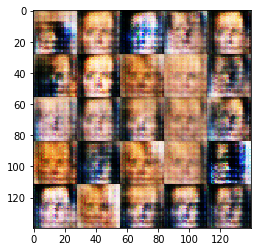

Epoch 1/1... Discriminator Loss: 1.7844... Generator Loss: 0.3141
Epoch 1/1... Discriminator Loss: 0.8481... Generator Loss: 1.7574
Epoch 1/1... Discriminator Loss: 0.7190... Generator Loss: 1.0313
Epoch 1/1... Discriminator Loss: 0.5999... Generator Loss: 1.2314
Epoch 1/1... Discriminator Loss: 0.9529... Generator Loss: 0.7797


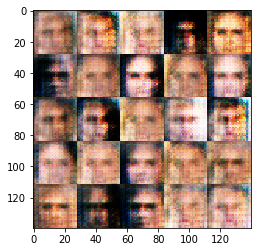

Epoch 1/1... Discriminator Loss: 1.0248... Generator Loss: 0.9560
Epoch 1/1... Discriminator Loss: 1.1124... Generator Loss: 0.7570
Epoch 1/1... Discriminator Loss: 1.0756... Generator Loss: 1.6555
Epoch 1/1... Discriminator Loss: 1.2985... Generator Loss: 0.5352
Epoch 1/1... Discriminator Loss: 0.7687... Generator Loss: 1.3230


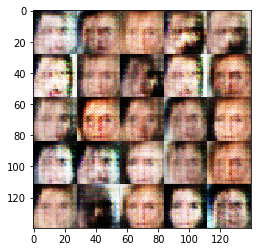

Epoch 1/1... Discriminator Loss: 1.0231... Generator Loss: 0.7343
Epoch 1/1... Discriminator Loss: 0.9715... Generator Loss: 0.7007
Epoch 1/1... Discriminator Loss: 1.0466... Generator Loss: 1.1393
Epoch 1/1... Discriminator Loss: 1.2280... Generator Loss: 0.6353
Epoch 1/1... Discriminator Loss: 0.5937... Generator Loss: 1.5741


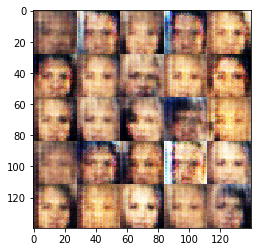

Epoch 1/1... Discriminator Loss: 0.7677... Generator Loss: 1.8803
Epoch 1/1... Discriminator Loss: 1.1510... Generator Loss: 0.6613
Epoch 1/1... Discriminator Loss: 1.4797... Generator Loss: 0.4683
Epoch 1/1... Discriminator Loss: 0.8437... Generator Loss: 0.9060
Epoch 1/1... Discriminator Loss: 0.9284... Generator Loss: 1.7046


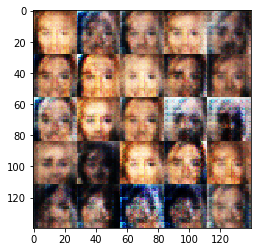

Epoch 1/1... Discriminator Loss: 0.9158... Generator Loss: 2.1579
Epoch 1/1... Discriminator Loss: 0.7685... Generator Loss: 1.4693
Epoch 1/1... Discriminator Loss: 0.7439... Generator Loss: 1.5041
Epoch 1/1... Discriminator Loss: 1.6857... Generator Loss: 0.3302
Epoch 1/1... Discriminator Loss: 0.8882... Generator Loss: 1.2739


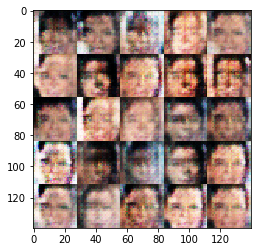

Epoch 1/1... Discriminator Loss: 0.9299... Generator Loss: 0.8348
Epoch 1/1... Discriminator Loss: 0.6945... Generator Loss: 1.6614
Epoch 1/1... Discriminator Loss: 0.9888... Generator Loss: 2.5563
Epoch 1/1... Discriminator Loss: 0.9019... Generator Loss: 1.5785
Epoch 1/1... Discriminator Loss: 0.7771... Generator Loss: 1.0687


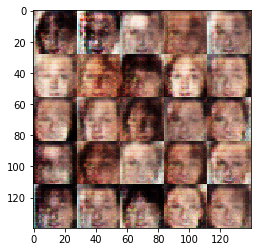

Epoch 1/1... Discriminator Loss: 0.8961... Generator Loss: 0.8822
Epoch 1/1... Discriminator Loss: 0.7497... Generator Loss: 1.2220
Epoch 1/1... Discriminator Loss: 1.5762... Generator Loss: 0.5980
Epoch 1/1... Discriminator Loss: 1.3291... Generator Loss: 0.5248
Epoch 1/1... Discriminator Loss: 1.4849... Generator Loss: 0.6914


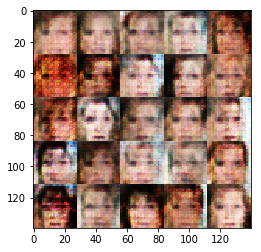

Epoch 1/1... Discriminator Loss: 0.7472... Generator Loss: 1.9361
Epoch 1/1... Discriminator Loss: 1.1825... Generator Loss: 2.1805
Epoch 1/1... Discriminator Loss: 0.9184... Generator Loss: 1.1323
Epoch 1/1... Discriminator Loss: 1.0940... Generator Loss: 0.9122
Epoch 1/1... Discriminator Loss: 1.0709... Generator Loss: 0.9118


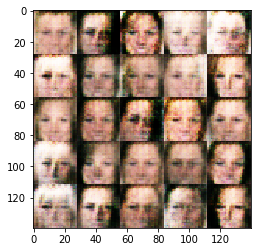

Epoch 1/1... Discriminator Loss: 0.6645... Generator Loss: 1.3147
Epoch 1/1... Discriminator Loss: 0.7823... Generator Loss: 0.7976
Epoch 1/1... Discriminator Loss: 1.0962... Generator Loss: 2.2234
Epoch 1/1... Discriminator Loss: 0.7243... Generator Loss: 1.1758
Epoch 1/1... Discriminator Loss: 1.1653... Generator Loss: 0.9602


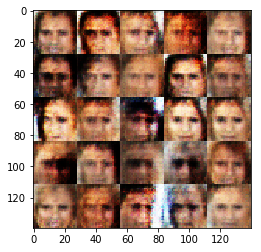

Epoch 1/1... Discriminator Loss: 1.6825... Generator Loss: 0.4055
Epoch 1/1... Discriminator Loss: 1.1921... Generator Loss: 2.2640
Epoch 1/1... Discriminator Loss: 0.9353... Generator Loss: 2.6500
Epoch 1/1... Discriminator Loss: 0.8497... Generator Loss: 0.8776
Epoch 1/1... Discriminator Loss: 0.7239... Generator Loss: 0.9772


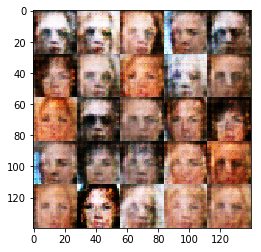

Epoch 1/1... Discriminator Loss: 1.0654... Generator Loss: 1.1648
Epoch 1/1... Discriminator Loss: 0.8721... Generator Loss: 1.1342
Epoch 1/1... Discriminator Loss: 1.5686... Generator Loss: 3.0582
Epoch 1/1... Discriminator Loss: 1.0975... Generator Loss: 0.7977
Epoch 1/1... Discriminator Loss: 0.9860... Generator Loss: 0.7909


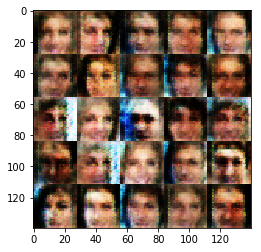

Epoch 1/1... Discriminator Loss: 0.6299... Generator Loss: 1.1846
Epoch 1/1... Discriminator Loss: 1.7156... Generator Loss: 0.3236
Epoch 1/1... Discriminator Loss: 1.2850... Generator Loss: 0.6482
Epoch 1/1... Discriminator Loss: 0.7917... Generator Loss: 1.3055
Epoch 1/1... Discriminator Loss: 0.9843... Generator Loss: 0.9422


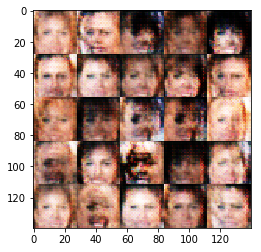

Epoch 1/1... Discriminator Loss: 2.2103... Generator Loss: 0.1822
Epoch 1/1... Discriminator Loss: 0.8791... Generator Loss: 0.9270
Epoch 1/1... Discriminator Loss: 0.9141... Generator Loss: 0.8270
Epoch 1/1... Discriminator Loss: 0.6838... Generator Loss: 1.1052
Epoch 1/1... Discriminator Loss: 1.1690... Generator Loss: 0.6328


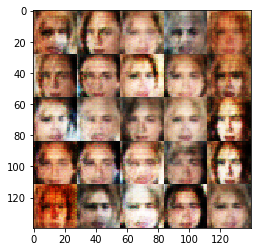

Epoch 1/1... Discriminator Loss: 1.4558... Generator Loss: 0.5114
Epoch 1/1... Discriminator Loss: 1.0601... Generator Loss: 0.8140
Epoch 1/1... Discriminator Loss: 1.1824... Generator Loss: 2.3653
Epoch 1/1... Discriminator Loss: 1.2966... Generator Loss: 0.8368
Epoch 1/1... Discriminator Loss: 0.7459... Generator Loss: 1.0076


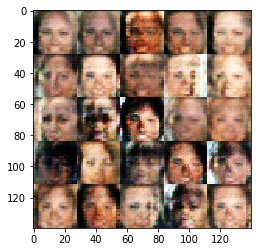

Epoch 1/1... Discriminator Loss: 1.6722... Generator Loss: 0.3768
Epoch 1/1... Discriminator Loss: 1.1040... Generator Loss: 1.0306
Epoch 1/1... Discriminator Loss: 0.9513... Generator Loss: 0.8647
Epoch 1/1... Discriminator Loss: 1.1828... Generator Loss: 0.5574
Epoch 1/1... Discriminator Loss: 1.2377... Generator Loss: 0.6176


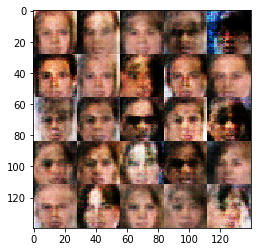

Epoch 1/1... Discriminator Loss: 0.8240... Generator Loss: 1.1673
Epoch 1/1... Discriminator Loss: 0.8057... Generator Loss: 2.4616
Epoch 1/1... Discriminator Loss: 0.8623... Generator Loss: 1.0250
Epoch 1/1... Discriminator Loss: 0.9539... Generator Loss: 1.2031
Epoch 1/1... Discriminator Loss: 1.0897... Generator Loss: 1.8594


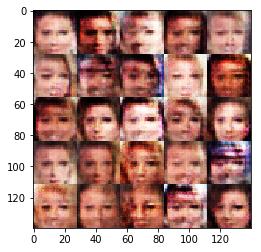

Epoch 1/1... Discriminator Loss: 0.8670... Generator Loss: 1.5986
Epoch 1/1... Discriminator Loss: 0.9894... Generator Loss: 0.7943
Epoch 1/1... Discriminator Loss: 1.0529... Generator Loss: 0.7210
Epoch 1/1... Discriminator Loss: 0.7545... Generator Loss: 1.2957
Epoch 1/1... Discriminator Loss: 1.0532... Generator Loss: 0.6509


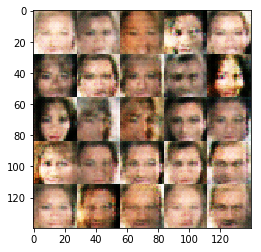

Epoch 1/1... Discriminator Loss: 1.0012... Generator Loss: 1.0641
Epoch 1/1... Discriminator Loss: 1.1711... Generator Loss: 0.6864
Epoch 1/1... Discriminator Loss: 1.7818... Generator Loss: 0.3121
Epoch 1/1... Discriminator Loss: 0.5840... Generator Loss: 2.1518
Epoch 1/1... Discriminator Loss: 0.9583... Generator Loss: 1.2060


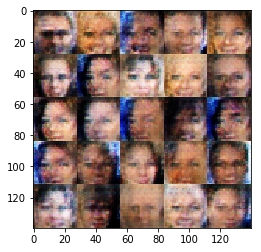

Epoch 1/1... Discriminator Loss: 1.6924... Generator Loss: 0.4108
Epoch 1/1... Discriminator Loss: 0.7804... Generator Loss: 1.7617
Epoch 1/1... Discriminator Loss: 1.8129... Generator Loss: 0.3110
Epoch 1/1... Discriminator Loss: 1.2946... Generator Loss: 0.4604
Epoch 1/1... Discriminator Loss: 0.9548... Generator Loss: 0.7723


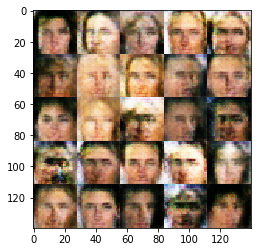

Epoch 1/1... Discriminator Loss: 1.5408... Generator Loss: 0.4817
Epoch 1/1... Discriminator Loss: 1.4312... Generator Loss: 0.5854
Epoch 1/1... Discriminator Loss: 0.8535... Generator Loss: 0.8006
Epoch 1/1... Discriminator Loss: 1.2121... Generator Loss: 2.6188
Epoch 1/1... Discriminator Loss: 1.2853... Generator Loss: 0.6302


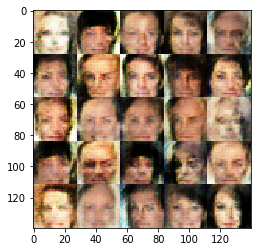

Epoch 1/1... Discriminator Loss: 0.7211... Generator Loss: 1.5950
Epoch 1/1... Discriminator Loss: 1.2013... Generator Loss: 0.8062
Epoch 1/1... Discriminator Loss: 1.1564... Generator Loss: 0.6659
Epoch 1/1... Discriminator Loss: 0.7142... Generator Loss: 1.5609
Epoch 1/1... Discriminator Loss: 1.7070... Generator Loss: 0.3131


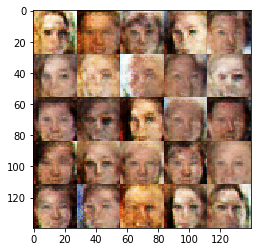

Epoch 1/1... Discriminator Loss: 0.9218... Generator Loss: 1.5502
Epoch 1/1... Discriminator Loss: 0.7698... Generator Loss: 1.4740
Epoch 1/1... Discriminator Loss: 1.2504... Generator Loss: 0.5538
Epoch 1/1... Discriminator Loss: 1.1884... Generator Loss: 2.6518
Epoch 1/1... Discriminator Loss: 1.0715... Generator Loss: 0.7328


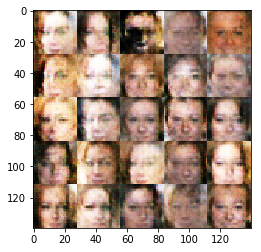

Epoch 1/1... Discriminator Loss: 1.2991... Generator Loss: 0.6733
Epoch 1/1... Discriminator Loss: 0.6817... Generator Loss: 1.4428
Epoch 1/1... Discriminator Loss: 0.8112... Generator Loss: 0.9630
Epoch 1/1... Discriminator Loss: 0.7138... Generator Loss: 1.1217
Epoch 1/1... Discriminator Loss: 1.3189... Generator Loss: 0.5966


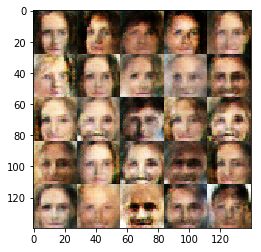

Epoch 1/1... Discriminator Loss: 0.7842... Generator Loss: 1.0736
Epoch 1/1... Discriminator Loss: 1.3707... Generator Loss: 0.5353
Epoch 1/1... Discriminator Loss: 0.7429... Generator Loss: 1.8629
Epoch 1/1... Discriminator Loss: 0.7643... Generator Loss: 1.6787
Epoch 1/1... Discriminator Loss: 0.5498... Generator Loss: 2.2300


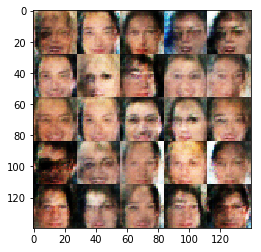

Epoch 1/1... Discriminator Loss: 1.3863... Generator Loss: 0.4459
Epoch 1/1... Discriminator Loss: 0.6515... Generator Loss: 1.3476
Epoch 1/1... Discriminator Loss: 0.9383... Generator Loss: 2.0076
Epoch 1/1... Discriminator Loss: 0.7594... Generator Loss: 1.4090
Epoch 1/1... Discriminator Loss: 0.6688... Generator Loss: 1.8061


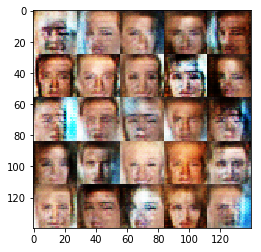

Epoch 1/1... Discriminator Loss: 1.4267... Generator Loss: 2.9366
Epoch 1/1... Discriminator Loss: 0.8986... Generator Loss: 1.0496
Epoch 1/1... Discriminator Loss: 1.7608... Generator Loss: 0.3072
Epoch 1/1... Discriminator Loss: 0.7829... Generator Loss: 1.3513
Epoch 1/1... Discriminator Loss: 0.8665... Generator Loss: 1.0759


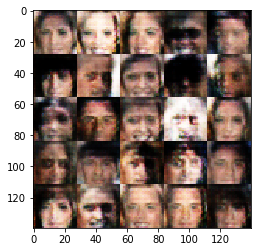

Epoch 1/1... Discriminator Loss: 0.8659... Generator Loss: 1.0591
Epoch 1/1... Discriminator Loss: 1.2239... Generator Loss: 0.6075
Epoch 1/1... Discriminator Loss: 0.6587... Generator Loss: 1.4484
Epoch 1/1... Discriminator Loss: 0.7537... Generator Loss: 1.5810
Epoch 1/1... Discriminator Loss: 0.7338... Generator Loss: 1.2519


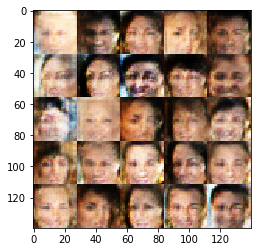

Epoch 1/1... Discriminator Loss: 0.6638... Generator Loss: 1.5606
Epoch 1/1... Discriminator Loss: 0.7508... Generator Loss: 1.0735
Epoch 1/1... Discriminator Loss: 1.5667... Generator Loss: 0.3257
Epoch 1/1... Discriminator Loss: 0.7738... Generator Loss: 1.2000
Epoch 1/1... Discriminator Loss: 1.2285... Generator Loss: 0.6407


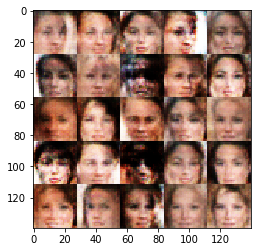

Epoch 1/1... Discriminator Loss: 0.7832... Generator Loss: 1.0083
Epoch 1/1... Discriminator Loss: 1.3606... Generator Loss: 0.5481
Epoch 1/1... Discriminator Loss: 0.8634... Generator Loss: 1.3091
Epoch 1/1... Discriminator Loss: 1.0943... Generator Loss: 0.6136
Epoch 1/1... Discriminator Loss: 0.9536... Generator Loss: 0.7701


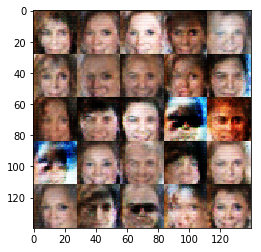

Epoch 1/1... Discriminator Loss: 2.1577... Generator Loss: 0.2526
Epoch 1/1... Discriminator Loss: 1.1363... Generator Loss: 1.4425
Epoch 1/1... Discriminator Loss: 0.7437... Generator Loss: 2.0793
Epoch 1/1... Discriminator Loss: 0.6915... Generator Loss: 1.7035
Epoch 1/1... Discriminator Loss: 0.6977... Generator Loss: 1.1964


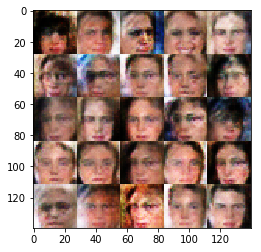

Epoch 1/1... Discriminator Loss: 0.7740... Generator Loss: 0.9684
Epoch 1/1... Discriminator Loss: 1.0622... Generator Loss: 0.6416
Epoch 1/1... Discriminator Loss: 0.9243... Generator Loss: 0.9171
Epoch 1/1... Discriminator Loss: 0.7582... Generator Loss: 1.5094
Epoch 1/1... Discriminator Loss: 1.7241... Generator Loss: 0.3699


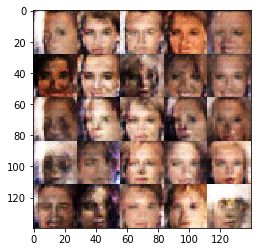

Epoch 1/1... Discriminator Loss: 0.6272... Generator Loss: 1.3100
Epoch 1/1... Discriminator Loss: 0.6341... Generator Loss: 1.8586
Epoch 1/1... Discriminator Loss: 0.7832... Generator Loss: 0.9283
Epoch 1/1... Discriminator Loss: 0.7728... Generator Loss: 1.3112
Epoch 1/1... Discriminator Loss: 1.9237... Generator Loss: 0.3343


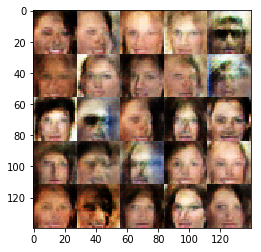

Epoch 1/1... Discriminator Loss: 0.8035... Generator Loss: 1.5329
Epoch 1/1... Discriminator Loss: 0.7320... Generator Loss: 2.0909
Epoch 1/1... Discriminator Loss: 1.0517... Generator Loss: 0.7915
Epoch 1/1... Discriminator Loss: 1.1328... Generator Loss: 0.6817
Epoch 1/1... Discriminator Loss: 0.8077... Generator Loss: 1.0324


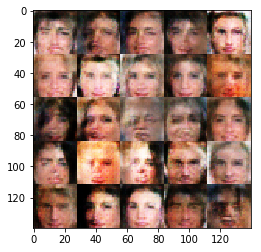

Epoch 1/1... Discriminator Loss: 1.5375... Generator Loss: 0.4881
Epoch 1/1... Discriminator Loss: 0.9094... Generator Loss: 0.9203
Epoch 1/1... Discriminator Loss: 0.6571... Generator Loss: 2.3213
Epoch 1/1... Discriminator Loss: 0.7748... Generator Loss: 1.4982
Epoch 1/1... Discriminator Loss: 1.2517... Generator Loss: 0.5995


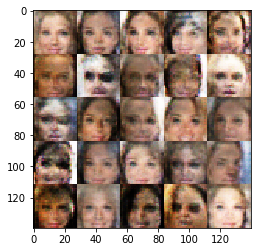

Epoch 1/1... Discriminator Loss: 0.9170... Generator Loss: 0.8402
Epoch 1/1... Discriminator Loss: 1.0291... Generator Loss: 0.7220
Epoch 1/1... Discriminator Loss: 0.9076... Generator Loss: 0.9263
Epoch 1/1... Discriminator Loss: 1.3153... Generator Loss: 0.4718
Epoch 1/1... Discriminator Loss: 0.9319... Generator Loss: 2.0998


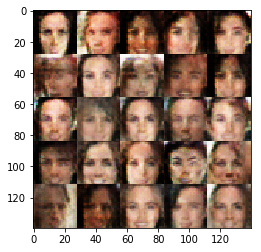

Epoch 1/1... Discriminator Loss: 1.1478... Generator Loss: 0.5595
Epoch 1/1... Discriminator Loss: 1.1019... Generator Loss: 0.8619
Epoch 1/1... Discriminator Loss: 0.7849... Generator Loss: 2.9717
Epoch 1/1... Discriminator Loss: 0.7573... Generator Loss: 1.0550
Epoch 1/1... Discriminator Loss: 1.6200... Generator Loss: 0.3952


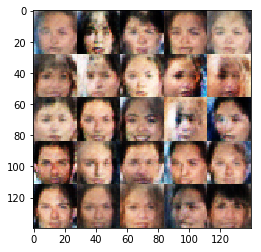

Epoch 1/1... Discriminator Loss: 0.9431... Generator Loss: 1.0807
Epoch 1/1... Discriminator Loss: 1.1030... Generator Loss: 0.6208
Epoch 1/1... Discriminator Loss: 2.2206... Generator Loss: 0.2111
Epoch 1/1... Discriminator Loss: 1.1842... Generator Loss: 0.6828
Epoch 1/1... Discriminator Loss: 1.3934... Generator Loss: 0.4360


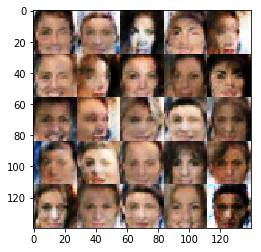

Epoch 1/1... Discriminator Loss: 1.0992... Generator Loss: 0.6363
Epoch 1/1... Discriminator Loss: 1.9658... Generator Loss: 0.2798
Epoch 1/1... Discriminator Loss: 0.5798... Generator Loss: 1.6285
Epoch 1/1... Discriminator Loss: 0.9863... Generator Loss: 0.8155
Epoch 1/1... Discriminator Loss: 0.7791... Generator Loss: 1.1308


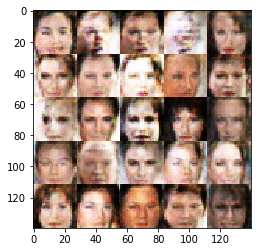

Epoch 1/1... Discriminator Loss: 0.7997... Generator Loss: 1.2696
Epoch 1/1... Discriminator Loss: 0.7741... Generator Loss: 1.1590
Epoch 1/1... Discriminator Loss: 0.8430... Generator Loss: 1.0808
Epoch 1/1... Discriminator Loss: 1.2748... Generator Loss: 0.4722
Epoch 1/1... Discriminator Loss: 0.9610... Generator Loss: 0.9215


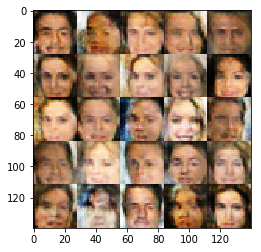

Epoch 1/1... Discriminator Loss: 1.2674... Generator Loss: 0.5597
Epoch 1/1... Discriminator Loss: 0.7894... Generator Loss: 1.3346
Epoch 1/1... Discriminator Loss: 1.2327... Generator Loss: 0.5845
Epoch 1/1... Discriminator Loss: 0.8745... Generator Loss: 2.0453
Epoch 1/1... Discriminator Loss: 2.2709... Generator Loss: 0.2402


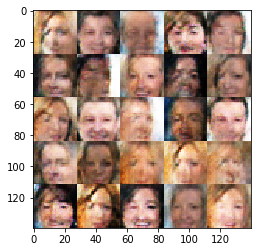

Epoch 1/1... Discriminator Loss: 0.8162... Generator Loss: 1.1128
Epoch 1/1... Discriminator Loss: 0.7711... Generator Loss: 1.7504
Epoch 1/1... Discriminator Loss: 0.7361... Generator Loss: 1.1258
Epoch 1/1... Discriminator Loss: 1.3365... Generator Loss: 2.7609
Epoch 1/1... Discriminator Loss: 1.3710... Generator Loss: 0.4986


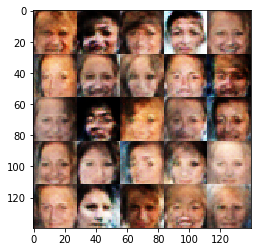

Epoch 1/1... Discriminator Loss: 1.3874... Generator Loss: 0.4733
Epoch 1/1... Discriminator Loss: 0.6863... Generator Loss: 1.4187
Epoch 1/1... Discriminator Loss: 1.2047... Generator Loss: 0.6593
Epoch 1/1... Discriminator Loss: 1.2113... Generator Loss: 0.5832
Epoch 1/1... Discriminator Loss: 1.2165... Generator Loss: 0.6045


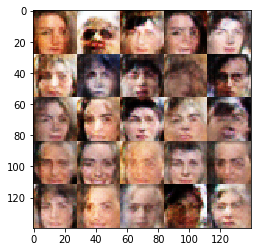

Epoch 1/1... Discriminator Loss: 0.7931... Generator Loss: 1.6838
Epoch 1/1... Discriminator Loss: 0.7068... Generator Loss: 1.1517
Epoch 1/1... Discriminator Loss: 0.9375... Generator Loss: 0.9639
Epoch 1/1... Discriminator Loss: 1.0103... Generator Loss: 2.5093
Epoch 1/1... Discriminator Loss: 0.9012... Generator Loss: 1.1623


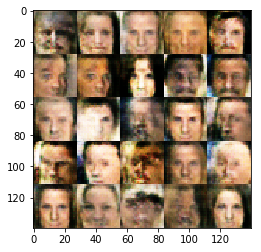

Epoch 1/1... Discriminator Loss: 0.9308... Generator Loss: 0.7576
Epoch 1/1... Discriminator Loss: 1.3956... Generator Loss: 0.6016
Epoch 1/1... Discriminator Loss: 0.6395... Generator Loss: 2.8078
Epoch 1/1... Discriminator Loss: 1.6682... Generator Loss: 0.4000
Epoch 1/1... Discriminator Loss: 1.6308... Generator Loss: 0.5174


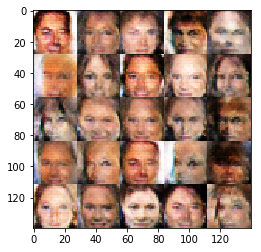

Epoch 1/1... Discriminator Loss: 0.9236... Generator Loss: 0.9570
Epoch 1/1... Discriminator Loss: 1.0941... Generator Loss: 1.9311
Epoch 1/1... Discriminator Loss: 2.0921... Generator Loss: 0.2913
Epoch 1/1... Discriminator Loss: 1.1328... Generator Loss: 0.6925
Epoch 1/1... Discriminator Loss: 2.2266... Generator Loss: 0.2362


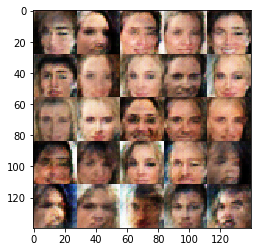

Epoch 1/1... Discriminator Loss: 1.6343... Generator Loss: 0.4106
Epoch 1/1... Discriminator Loss: 0.9593... Generator Loss: 0.7623
Epoch 1/1... Discriminator Loss: 0.7736... Generator Loss: 2.4699
Epoch 1/1... Discriminator Loss: 1.8713... Generator Loss: 0.3174
Epoch 1/1... Discriminator Loss: 0.7293... Generator Loss: 1.4618


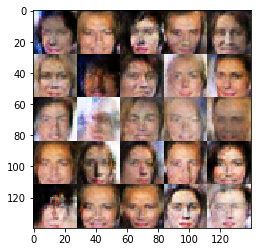

Epoch 1/1... Discriminator Loss: 0.7963... Generator Loss: 1.8462
Epoch 1/1... Discriminator Loss: 0.6045... Generator Loss: 1.7903
Epoch 1/1... Discriminator Loss: 1.0393... Generator Loss: 0.6361
Epoch 1/1... Discriminator Loss: 1.2070... Generator Loss: 0.6871
Epoch 1/1... Discriminator Loss: 1.9121... Generator Loss: 0.3083


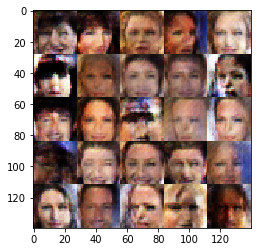

Epoch 1/1... Discriminator Loss: 1.8178... Generator Loss: 0.3236
Epoch 1/1... Discriminator Loss: 0.7828... Generator Loss: 1.1798
Epoch 1/1... Discriminator Loss: 0.6882... Generator Loss: 1.9372
Epoch 1/1... Discriminator Loss: 1.3614... Generator Loss: 0.6156
Epoch 1/1... Discriminator Loss: 1.2661... Generator Loss: 0.5271


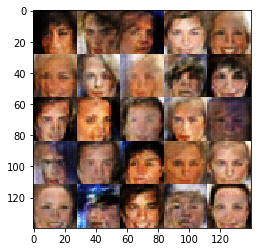

Epoch 1/1... Discriminator Loss: 1.9320... Generator Loss: 0.2868
Epoch 1/1... Discriminator Loss: 0.6584... Generator Loss: 1.7744
Epoch 1/1... Discriminator Loss: 1.2634... Generator Loss: 0.7176
Epoch 1/1... Discriminator Loss: 0.8552... Generator Loss: 0.8751
Epoch 1/1... Discriminator Loss: 1.2332... Generator Loss: 0.5770


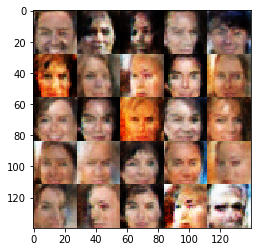

Epoch 1/1... Discriminator Loss: 0.9369... Generator Loss: 0.8375
Epoch 1/1... Discriminator Loss: 2.0941... Generator Loss: 0.2317
Epoch 1/1... Discriminator Loss: 1.4187... Generator Loss: 0.6980
Epoch 1/1... Discriminator Loss: 1.0109... Generator Loss: 0.7616
Epoch 1/1... Discriminator Loss: 0.7316... Generator Loss: 1.7492


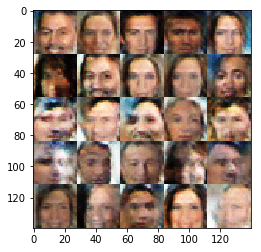

Epoch 1/1... Discriminator Loss: 1.2227... Generator Loss: 0.5888
Epoch 1/1... Discriminator Loss: 0.8464... Generator Loss: 1.1109
Epoch 1/1... Discriminator Loss: 0.7879... Generator Loss: 1.4337
Epoch 1/1... Discriminator Loss: 1.4176... Generator Loss: 0.4972
Epoch 1/1... Discriminator Loss: 0.6547... Generator Loss: 1.2902


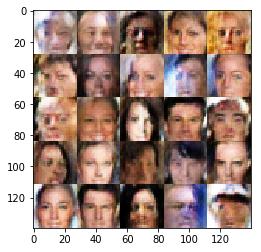

Epoch 1/1... Discriminator Loss: 0.8951... Generator Loss: 1.4915
Epoch 1/1... Discriminator Loss: 1.3199... Generator Loss: 0.6002
Epoch 1/1... Discriminator Loss: 0.8006... Generator Loss: 2.3714
Epoch 1/1... Discriminator Loss: 1.1727... Generator Loss: 0.6698
Epoch 1/1... Discriminator Loss: 2.2674... Generator Loss: 0.2518


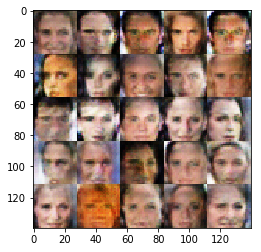

Epoch 1/1... Discriminator Loss: 1.0232... Generator Loss: 0.9095
Epoch 1/1... Discriminator Loss: 1.6948... Generator Loss: 0.4086
Epoch 1/1... Discriminator Loss: 0.8302... Generator Loss: 1.0160
Epoch 1/1... Discriminator Loss: 0.8990... Generator Loss: 0.8281
Epoch 1/1... Discriminator Loss: 1.9929... Generator Loss: 0.2926


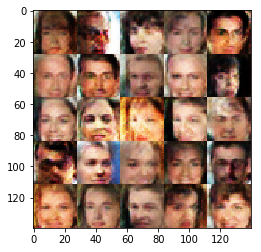

Epoch 1/1... Discriminator Loss: 0.7909... Generator Loss: 1.9213
Epoch 1/1... Discriminator Loss: 1.4172... Generator Loss: 0.6197
Epoch 1/1... Discriminator Loss: 1.1845... Generator Loss: 0.6128
Epoch 1/1... Discriminator Loss: 1.7139... Generator Loss: 0.3500
Epoch 1/1... Discriminator Loss: 0.6973... Generator Loss: 1.2799


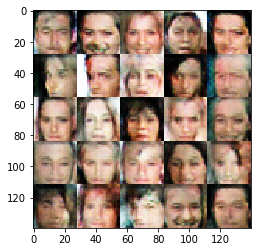

Epoch 1/1... Discriminator Loss: 0.8293... Generator Loss: 0.8411
Epoch 1/1... Discriminator Loss: 1.5574... Generator Loss: 0.4010
Epoch 1/1... Discriminator Loss: 1.3415... Generator Loss: 0.4605
Epoch 1/1... Discriminator Loss: 1.0372... Generator Loss: 0.7143
Epoch 1/1... Discriminator Loss: 0.8172... Generator Loss: 1.0485


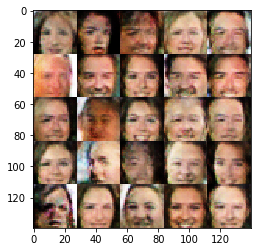

Epoch 1/1... Discriminator Loss: 2.6651... Generator Loss: 0.1233
Epoch 1/1... Discriminator Loss: 1.3847... Generator Loss: 0.6754
Epoch 1/1... Discriminator Loss: 1.0744... Generator Loss: 0.6262
Epoch 1/1... Discriminator Loss: 0.8353... Generator Loss: 0.9857
Epoch 1/1... Discriminator Loss: 1.6626... Generator Loss: 0.3577


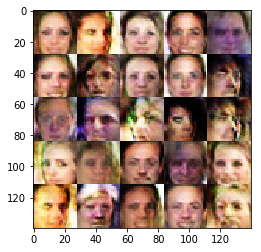

Epoch 1/1... Discriminator Loss: 1.7065... Generator Loss: 0.5643
Epoch 1/1... Discriminator Loss: 1.2969... Generator Loss: 0.7161
Epoch 1/1... Discriminator Loss: 0.6487... Generator Loss: 1.0836
Epoch 1/1... Discriminator Loss: 1.5831... Generator Loss: 3.1018
Epoch 1/1... Discriminator Loss: 0.9717... Generator Loss: 0.6794


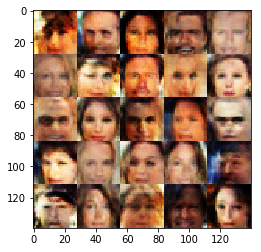

Epoch 1/1... Discriminator Loss: 1.1999... Generator Loss: 3.1545
Epoch 1/1... Discriminator Loss: 1.8349... Generator Loss: 0.3460
Epoch 1/1... Discriminator Loss: 0.9380... Generator Loss: 0.9440
Epoch 1/1... Discriminator Loss: 0.8138... Generator Loss: 0.9424
Epoch 1/1... Discriminator Loss: 2.3986... Generator Loss: 0.2137


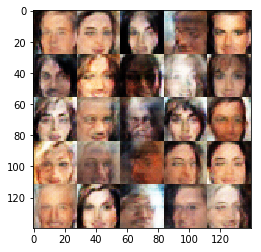

Epoch 1/1... Discriminator Loss: 0.6201... Generator Loss: 1.5336
Epoch 1/1... Discriminator Loss: 0.7736... Generator Loss: 2.3367
Epoch 1/1... Discriminator Loss: 0.7602... Generator Loss: 1.4549
Epoch 1/1... Discriminator Loss: 0.9875... Generator Loss: 0.8408
Epoch 1/1... Discriminator Loss: 0.9823... Generator Loss: 0.8395


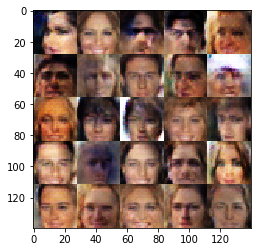

Epoch 1/1... Discriminator Loss: 1.6756... Generator Loss: 0.2864
Epoch 1/1... Discriminator Loss: 1.0926... Generator Loss: 2.8192
Epoch 1/1... Discriminator Loss: 1.3352... Generator Loss: 0.4767
Epoch 1/1... Discriminator Loss: 0.6782... Generator Loss: 1.7167
Epoch 1/1... Discriminator Loss: 0.7640... Generator Loss: 1.0694


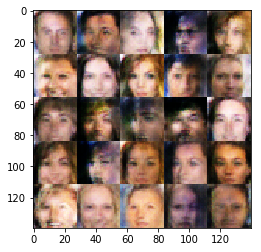

Epoch 1/1... Discriminator Loss: 0.9361... Generator Loss: 0.7509
Epoch 1/1... Discriminator Loss: 1.0097... Generator Loss: 0.8724
Epoch 1/1... Discriminator Loss: 1.2220... Generator Loss: 0.5984
Epoch 1/1... Discriminator Loss: 1.5915... Generator Loss: 0.3873
Epoch 1/1... Discriminator Loss: 1.1572... Generator Loss: 0.7179


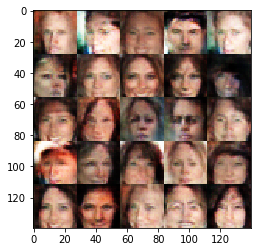

Epoch 1/1... Discriminator Loss: 1.0280... Generator Loss: 0.8066
Epoch 1/1... Discriminator Loss: 0.8549... Generator Loss: 0.9136
Epoch 1/1... Discriminator Loss: 0.9553... Generator Loss: 1.2670
Epoch 1/1... Discriminator Loss: 0.7824... Generator Loss: 1.0570
Epoch 1/1... Discriminator Loss: 1.2849... Generator Loss: 3.0281


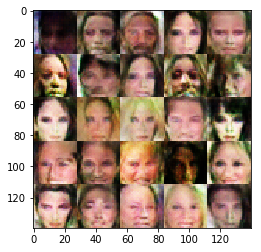

Epoch 1/1... Discriminator Loss: 0.6671... Generator Loss: 1.3987
Epoch 1/1... Discriminator Loss: 1.2571... Generator Loss: 0.6490
Epoch 1/1... Discriminator Loss: 1.6327... Generator Loss: 0.3319
Epoch 1/1... Discriminator Loss: 1.1902... Generator Loss: 0.5919
Epoch 1/1... Discriminator Loss: 0.7227... Generator Loss: 1.1442


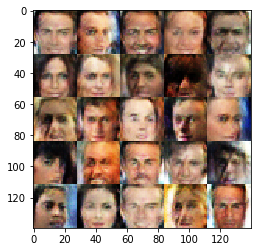

Epoch 1/1... Discriminator Loss: 0.8534... Generator Loss: 1.0919
Epoch 1/1... Discriminator Loss: 0.9258... Generator Loss: 0.8507
Epoch 1/1... Discriminator Loss: 0.8875... Generator Loss: 0.8530
Epoch 1/1... Discriminator Loss: 1.6159... Generator Loss: 0.3248
Epoch 1/1... Discriminator Loss: 1.3084... Generator Loss: 0.4951


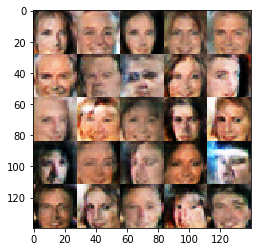

Epoch 1/1... Discriminator Loss: 1.7546... Generator Loss: 0.2704
Epoch 1/1... Discriminator Loss: 2.3415... Generator Loss: 0.1893
Epoch 1/1... Discriminator Loss: 0.9401... Generator Loss: 0.7607
Epoch 1/1... Discriminator Loss: 1.3810... Generator Loss: 0.4683
Epoch 1/1... Discriminator Loss: 0.9894... Generator Loss: 0.7626


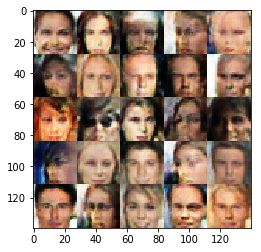

Epoch 1/1... Discriminator Loss: 0.8189... Generator Loss: 1.1208
Epoch 1/1... Discriminator Loss: 0.6195... Generator Loss: 1.7174
Epoch 1/1... Discriminator Loss: 1.1622... Generator Loss: 0.5671
Epoch 1/1... Discriminator Loss: 2.1832... Generator Loss: 0.2471
Epoch 1/1... Discriminator Loss: 1.0684... Generator Loss: 0.8006


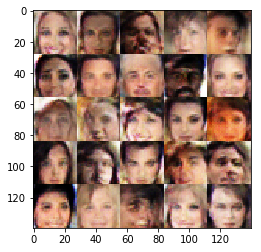

Epoch 1/1... Discriminator Loss: 0.6615... Generator Loss: 1.5959
Epoch 1/1... Discriminator Loss: 1.4068... Generator Loss: 0.5265
Epoch 1/1... Discriminator Loss: 1.7960... Generator Loss: 0.3123
Epoch 1/1... Discriminator Loss: 1.0539... Generator Loss: 0.7370
Epoch 1/1... Discriminator Loss: 0.6394... Generator Loss: 1.6183


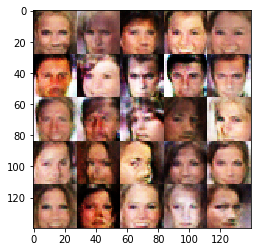

Epoch 1/1... Discriminator Loss: 1.5917... Generator Loss: 0.4061
Epoch 1/1... Discriminator Loss: 0.8369... Generator Loss: 0.9010
Epoch 1/1... Discriminator Loss: 1.4981... Generator Loss: 3.3865
Epoch 1/1... Discriminator Loss: 0.8969... Generator Loss: 0.7516
Epoch 1/1... Discriminator Loss: 2.5490... Generator Loss: 0.1836


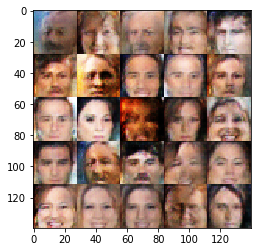

Epoch 1/1... Discriminator Loss: 0.6729... Generator Loss: 1.1176
Epoch 1/1... Discriminator Loss: 1.0249... Generator Loss: 0.7888
Epoch 1/1... Discriminator Loss: 1.6788... Generator Loss: 3.6684
Epoch 1/1... Discriminator Loss: 1.1149... Generator Loss: 0.6510
Epoch 1/1... Discriminator Loss: 0.9170... Generator Loss: 0.7778


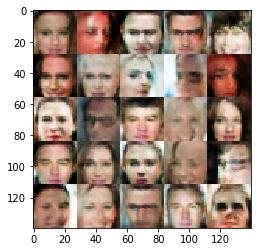

Epoch 1/1... Discriminator Loss: 0.7645... Generator Loss: 1.2479
Epoch 1/1... Discriminator Loss: 1.6107... Generator Loss: 0.5035
Epoch 1/1... Discriminator Loss: 0.9416... Generator Loss: 1.8965
Epoch 1/1... Discriminator Loss: 1.2988... Generator Loss: 2.3006
Epoch 1/1... Discriminator Loss: 0.9728... Generator Loss: 2.5175


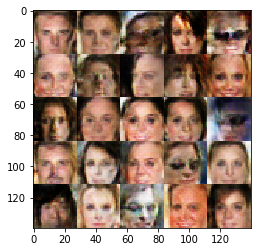

Epoch 1/1... Discriminator Loss: 1.9408... Generator Loss: 0.2677
Epoch 1/1... Discriminator Loss: 1.2430... Generator Loss: 0.6728
Epoch 1/1... Discriminator Loss: 0.8847... Generator Loss: 0.9743
Epoch 1/1... Discriminator Loss: 1.1291... Generator Loss: 0.7302
Epoch 1/1... Discriminator Loss: 1.4750... Generator Loss: 0.4857


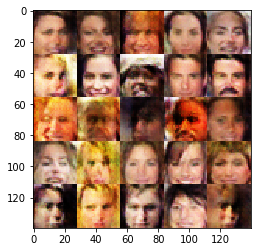

Epoch 1/1... Discriminator Loss: 0.9980... Generator Loss: 0.7382
Epoch 1/1... Discriminator Loss: 0.7883... Generator Loss: 0.9798
Epoch 1/1... Discriminator Loss: 0.8816... Generator Loss: 2.1142
Epoch 1/1... Discriminator Loss: 0.8593... Generator Loss: 0.9042
Epoch 1/1... Discriminator Loss: 1.1343... Generator Loss: 0.7165


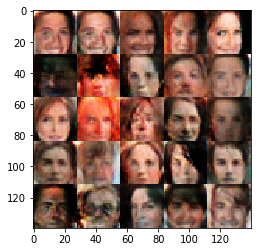

Epoch 1/1... Discriminator Loss: 0.6886... Generator Loss: 2.2909
Epoch 1/1... Discriminator Loss: 1.1707... Generator Loss: 0.8419
Epoch 1/1... Discriminator Loss: 1.1043... Generator Loss: 0.7477
Epoch 1/1... Discriminator Loss: 1.0097... Generator Loss: 1.2520
Epoch 1/1... Discriminator Loss: 0.7978... Generator Loss: 2.5795


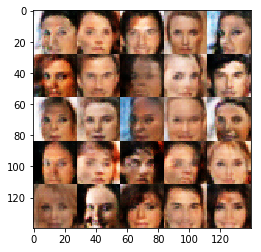

Epoch 1/1... Discriminator Loss: 1.0494... Generator Loss: 0.8786
Epoch 1/1... Discriminator Loss: 1.8181... Generator Loss: 0.3125
Epoch 1/1... Discriminator Loss: 0.9611... Generator Loss: 0.7237
Epoch 1/1... Discriminator Loss: 1.4405... Generator Loss: 0.4450
Epoch 1/1... Discriminator Loss: 1.1402... Generator Loss: 0.6740


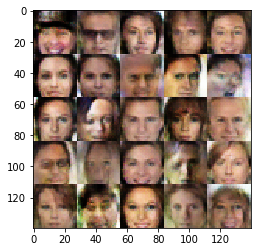

Epoch 1/1... Discriminator Loss: 0.9721... Generator Loss: 0.8942
Epoch 1/1... Discriminator Loss: 0.7049... Generator Loss: 1.8389
Epoch 1/1... Discriminator Loss: 1.2033... Generator Loss: 0.5337
Epoch 1/1... Discriminator Loss: 1.6101... Generator Loss: 0.3664
Epoch 1/1... Discriminator Loss: 0.9979... Generator Loss: 0.7437


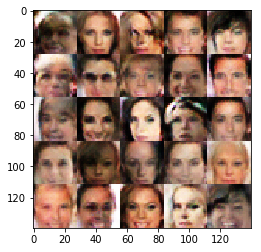

Epoch 1/1... Discriminator Loss: 2.0122... Generator Loss: 0.2059
Epoch 1/1... Discriminator Loss: 0.8251... Generator Loss: 2.3187
Epoch 1/1... Discriminator Loss: 1.2115... Generator Loss: 0.5805
Epoch 1/1... Discriminator Loss: 0.6927... Generator Loss: 0.9248
Epoch 1/1... Discriminator Loss: 0.9632... Generator Loss: 0.9843


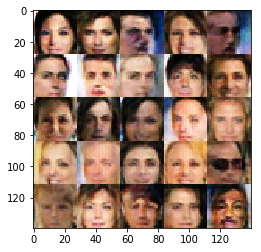

Epoch 1/1... Discriminator Loss: 1.8243... Generator Loss: 0.3690
Epoch 1/1... Discriminator Loss: 1.6225... Generator Loss: 3.1151
Epoch 1/1... Discriminator Loss: 1.2571... Generator Loss: 0.6333
Epoch 1/1... Discriminator Loss: 1.1167... Generator Loss: 0.6755
Epoch 1/1... Discriminator Loss: 0.6422... Generator Loss: 1.2991


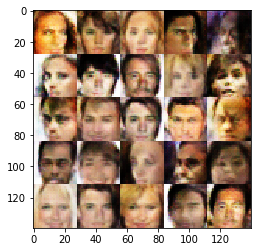

Epoch 1/1... Discriminator Loss: 0.6867... Generator Loss: 1.6959
Epoch 1/1... Discriminator Loss: 1.4001... Generator Loss: 0.5541
Epoch 1/1... Discriminator Loss: 1.0069... Generator Loss: 0.7726
Epoch 1/1... Discriminator Loss: 1.3899... Generator Loss: 0.5018
Epoch 1/1... Discriminator Loss: 0.9632... Generator Loss: 0.8369


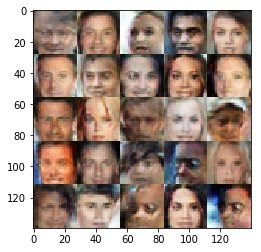

Epoch 1/1... Discriminator Loss: 0.6444... Generator Loss: 1.6118
Epoch 1/1... Discriminator Loss: 1.5950... Generator Loss: 0.4097
Epoch 1/1... Discriminator Loss: 1.2725... Generator Loss: 0.6226
Epoch 1/1... Discriminator Loss: 0.8928... Generator Loss: 0.8645
Epoch 1/1... Discriminator Loss: 1.2098... Generator Loss: 0.5767


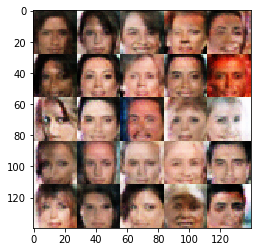

Epoch 1/1... Discriminator Loss: 1.3341... Generator Loss: 0.4190
Epoch 1/1... Discriminator Loss: 1.7650... Generator Loss: 0.3735
Epoch 1/1... Discriminator Loss: 1.5612... Generator Loss: 0.4435
Epoch 1/1... Discriminator Loss: 0.6529... Generator Loss: 1.2750
Epoch 1/1... Discriminator Loss: 1.4968... Generator Loss: 0.3570


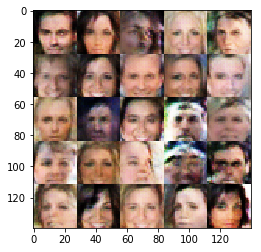

Epoch 1/1... Discriminator Loss: 0.5885... Generator Loss: 1.5845
Epoch 1/1... Discriminator Loss: 0.8889... Generator Loss: 1.0561
Epoch 1/1... Discriminator Loss: 1.2605... Generator Loss: 0.5933
Epoch 1/1... Discriminator Loss: 0.6376... Generator Loss: 1.4382
Epoch 1/1... Discriminator Loss: 0.6244... Generator Loss: 1.2728


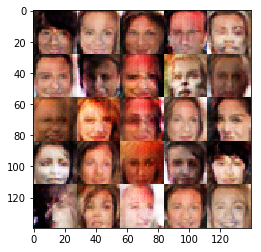

Epoch 1/1... Discriminator Loss: 2.3729... Generator Loss: 0.1965
Epoch 1/1... Discriminator Loss: 0.7317... Generator Loss: 1.4458
Epoch 1/1... Discriminator Loss: 0.8568... Generator Loss: 1.0597
Epoch 1/1... Discriminator Loss: 1.3818... Generator Loss: 0.5501
Epoch 1/1... Discriminator Loss: 1.8314... Generator Loss: 0.4924


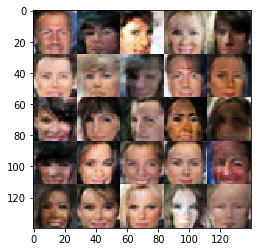

Epoch 1/1... Discriminator Loss: 0.9950... Generator Loss: 0.8646
Epoch 1/1... Discriminator Loss: 1.5570... Generator Loss: 0.4588
Epoch 1/1... Discriminator Loss: 0.6876... Generator Loss: 1.5458
Epoch 1/1... Discriminator Loss: 0.9864... Generator Loss: 0.7907
Epoch 1/1... Discriminator Loss: 1.1078... Generator Loss: 0.6361


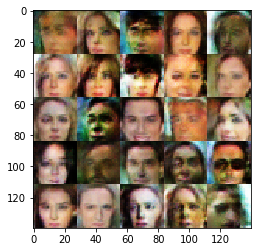

Epoch 1/1... Discriminator Loss: 1.0314... Generator Loss: 0.7277
Epoch 1/1... Discriminator Loss: 1.5075... Generator Loss: 0.5383
Epoch 1/1... Discriminator Loss: 0.4870... Generator Loss: 1.4682
Epoch 1/1... Discriminator Loss: 0.5604... Generator Loss: 1.6597
Epoch 1/1... Discriminator Loss: 0.7341... Generator Loss: 1.2025


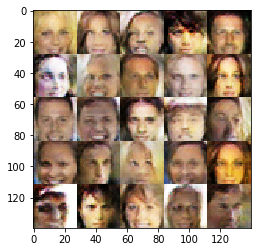

Epoch 1/1... Discriminator Loss: 2.3595... Generator Loss: 0.2108
Epoch 1/1... Discriminator Loss: 1.0021... Generator Loss: 0.9951
Epoch 1/1... Discriminator Loss: 0.6612... Generator Loss: 1.2436
Epoch 1/1... Discriminator Loss: 1.4077... Generator Loss: 0.7133
Epoch 1/1... Discriminator Loss: 2.0164... Generator Loss: 0.2821


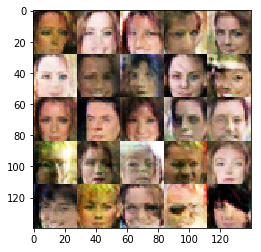

Epoch 1/1... Discriminator Loss: 1.5863... Generator Loss: 0.5029
Epoch 1/1... Discriminator Loss: 0.8516... Generator Loss: 1.0816
Epoch 1/1... Discriminator Loss: 0.8297... Generator Loss: 1.0372
Epoch 1/1... Discriminator Loss: 0.6189... Generator Loss: 1.2366
Epoch 1/1... Discriminator Loss: 1.5299... Generator Loss: 0.4569


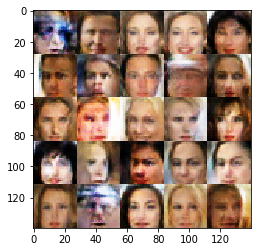

Epoch 1/1... Discriminator Loss: 0.9120... Generator Loss: 1.0122
Epoch 1/1... Discriminator Loss: 0.9922... Generator Loss: 2.3390
Epoch 1/1... Discriminator Loss: 0.8453... Generator Loss: 1.2811
Epoch 1/1... Discriminator Loss: 1.3137... Generator Loss: 0.6260
Epoch 1/1... Discriminator Loss: 0.6988... Generator Loss: 1.2813


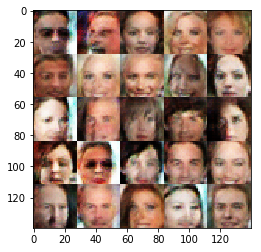

Epoch 1/1... Discriminator Loss: 0.8137... Generator Loss: 1.1212
Epoch 1/1... Discriminator Loss: 1.0264... Generator Loss: 0.8041
Epoch 1/1... Discriminator Loss: 0.8784... Generator Loss: 0.8331
Epoch 1/1... Discriminator Loss: 1.2714... Generator Loss: 0.5641
Epoch 1/1... Discriminator Loss: 0.7592... Generator Loss: 1.1955


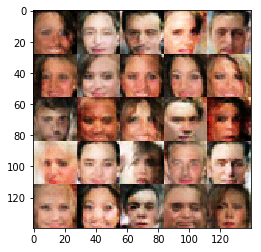

Epoch 1/1... Discriminator Loss: 0.6176... Generator Loss: 1.6216
Epoch 1/1... Discriminator Loss: 0.9069... Generator Loss: 0.8603
Epoch 1/1... Discriminator Loss: 0.6198... Generator Loss: 1.7604
Epoch 1/1... Discriminator Loss: 1.0911... Generator Loss: 0.5975
Epoch 1/1... Discriminator Loss: 1.0957... Generator Loss: 0.7251


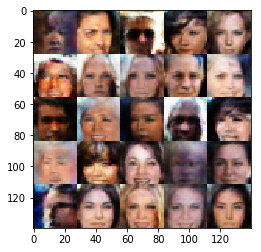

Epoch 1/1... Discriminator Loss: 1.0158... Generator Loss: 0.8366
Epoch 1/1... Discriminator Loss: 0.6971... Generator Loss: 1.2515
Epoch 1/1... Discriminator Loss: 0.7702... Generator Loss: 1.0810
Epoch 1/1... Discriminator Loss: 1.3224... Generator Loss: 0.4834
Epoch 1/1... Discriminator Loss: 1.5126... Generator Loss: 0.4068


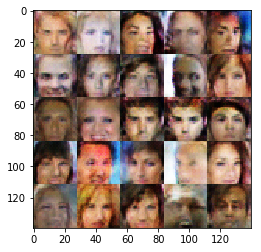

Epoch 1/1... Discriminator Loss: 0.6506... Generator Loss: 1.2092
Epoch 1/1... Discriminator Loss: 0.7956... Generator Loss: 1.0748
Epoch 1/1... Discriminator Loss: 0.9319... Generator Loss: 0.8951
Epoch 1/1... Discriminator Loss: 1.6996... Generator Loss: 3.7697
Epoch 1/1... Discriminator Loss: 1.1753... Generator Loss: 0.5693


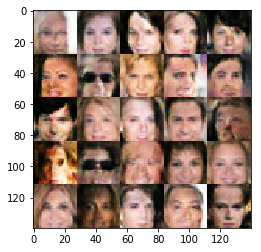

Epoch 1/1... Discriminator Loss: 1.0078... Generator Loss: 0.8771
Epoch 1/1... Discriminator Loss: 0.5977... Generator Loss: 1.3487
Epoch 1/1... Discriminator Loss: 1.9800... Generator Loss: 0.2829
Epoch 1/1... Discriminator Loss: 0.8751... Generator Loss: 0.9092
Epoch 1/1... Discriminator Loss: 0.7121... Generator Loss: 1.2650


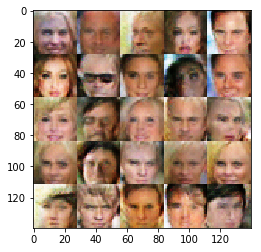

Epoch 1/1... Discriminator Loss: 1.0154... Generator Loss: 0.7291
Epoch 1/1... Discriminator Loss: 1.8219... Generator Loss: 0.2962
Epoch 1/1... Discriminator Loss: 0.6283... Generator Loss: 1.1017
Epoch 1/1... Discriminator Loss: 1.1608... Generator Loss: 0.8372
Epoch 1/1... Discriminator Loss: 1.8749... Generator Loss: 0.3739


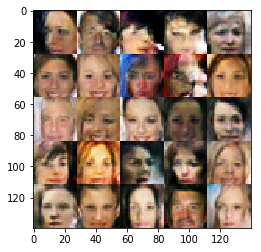

Epoch 1/1... Discriminator Loss: 0.7326... Generator Loss: 1.0856
Epoch 1/1... Discriminator Loss: 1.8265... Generator Loss: 0.3973
Epoch 1/1... Discriminator Loss: 0.9219... Generator Loss: 0.8443
Epoch 1/1... Discriminator Loss: 0.7732... Generator Loss: 0.9524
Epoch 1/1... Discriminator Loss: 1.5789... Generator Loss: 0.4161


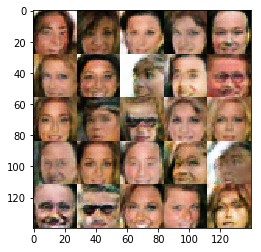

Epoch 1/1... Discriminator Loss: 0.6907... Generator Loss: 1.9463
Epoch 1/1... Discriminator Loss: 0.5942... Generator Loss: 1.9395
Epoch 1/1... Discriminator Loss: 0.7750... Generator Loss: 1.1163
Epoch 1/1... Discriminator Loss: 1.2236... Generator Loss: 0.5385
Epoch 1/1... Discriminator Loss: 1.3275... Generator Loss: 0.4848


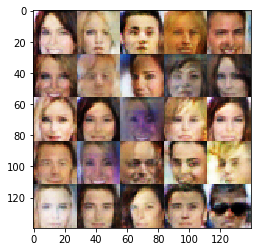

Epoch 1/1... Discriminator Loss: 0.6238... Generator Loss: 1.6507
Epoch 1/1... Discriminator Loss: 0.9392... Generator Loss: 0.7258
Epoch 1/1... Discriminator Loss: 1.5694... Generator Loss: 0.3998
Epoch 1/1... Discriminator Loss: 1.2622... Generator Loss: 0.6280
Epoch 1/1... Discriminator Loss: 0.6608... Generator Loss: 1.3470


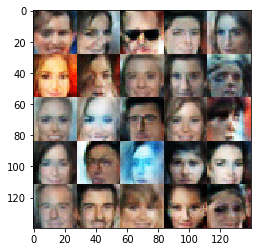

Epoch 1/1... Discriminator Loss: 0.5752... Generator Loss: 1.6925
Epoch 1/1... Discriminator Loss: 0.6113... Generator Loss: 2.3110
Epoch 1/1... Discriminator Loss: 0.6919... Generator Loss: 1.1309
Epoch 1/1... Discriminator Loss: 1.3667... Generator Loss: 0.4744
Epoch 1/1... Discriminator Loss: 0.6085... Generator Loss: 2.2930


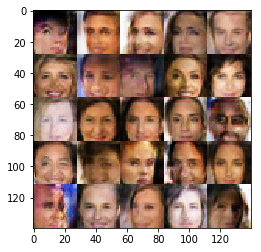

Epoch 1/1... Discriminator Loss: 2.0829... Generator Loss: 0.3445
Epoch 1/1... Discriminator Loss: 0.6904... Generator Loss: 1.1930
Epoch 1/1... Discriminator Loss: 0.8088... Generator Loss: 1.0073
Epoch 1/1... Discriminator Loss: 0.8438... Generator Loss: 0.7801
Epoch 1/1... Discriminator Loss: 1.7256... Generator Loss: 0.3138


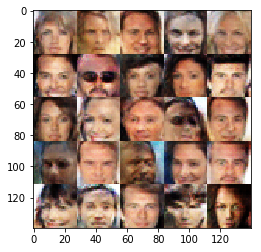

Epoch 1/1... Discriminator Loss: 0.3609... Generator Loss: 2.1312
Epoch 1/1... Discriminator Loss: 0.6416... Generator Loss: 1.5089
Epoch 1/1... Discriminator Loss: 0.9972... Generator Loss: 0.6749
Epoch 1/1... Discriminator Loss: 1.0916... Generator Loss: 0.5861
Epoch 1/1... Discriminator Loss: 1.6181... Generator Loss: 0.4467


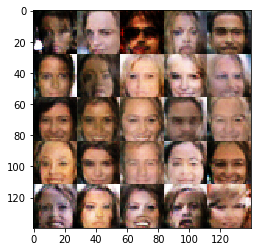

Epoch 1/1... Discriminator Loss: 1.0864... Generator Loss: 0.6352
Epoch 1/1... Discriminator Loss: 0.6458... Generator Loss: 2.3707
Epoch 1/1... Discriminator Loss: 1.0492... Generator Loss: 0.6873
Epoch 1/1... Discriminator Loss: 0.8993... Generator Loss: 0.8096
Epoch 1/1... Discriminator Loss: 1.1253... Generator Loss: 0.6791


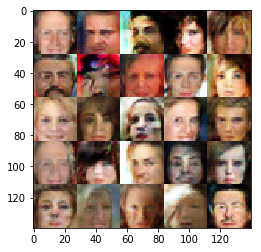

Epoch 1/1... Discriminator Loss: 1.3343... Generator Loss: 0.5688
Epoch 1/1... Discriminator Loss: 1.0098... Generator Loss: 0.9302
Epoch 1/1... Discriminator Loss: 1.8285... Generator Loss: 0.4478
Epoch 1/1... Discriminator Loss: 1.9700... Generator Loss: 0.2650
Epoch 1/1... Discriminator Loss: 0.9920... Generator Loss: 0.9220


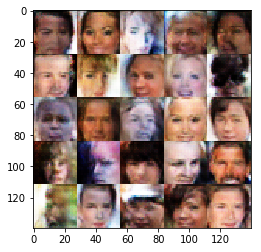

Epoch 1/1... Discriminator Loss: 2.3072... Generator Loss: 0.1852
Epoch 1/1... Discriminator Loss: 0.9945... Generator Loss: 0.7583
Epoch 1/1... Discriminator Loss: 1.5188... Generator Loss: 0.4770
Epoch 1/1... Discriminator Loss: 0.6658... Generator Loss: 1.4336
Epoch 1/1... Discriminator Loss: 0.8300... Generator Loss: 0.9318


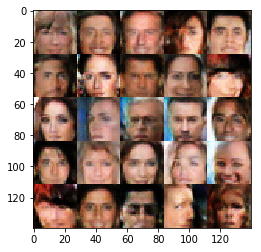

Epoch 1/1... Discriminator Loss: 0.8215... Generator Loss: 0.9474
Epoch 1/1... Discriminator Loss: 0.6425... Generator Loss: 2.1937
Epoch 1/1... Discriminator Loss: 1.7151... Generator Loss: 0.3466
Epoch 1/1... Discriminator Loss: 1.2236... Generator Loss: 0.6909
Epoch 1/1... Discriminator Loss: 2.0463... Generator Loss: 0.2162


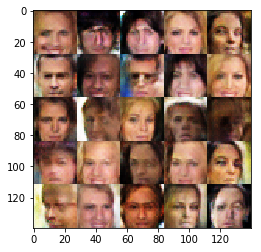

Epoch 1/1... Discriminator Loss: 0.9990... Generator Loss: 0.8302
Epoch 1/1... Discriminator Loss: 1.8306... Generator Loss: 0.2519
Epoch 1/1... Discriminator Loss: 1.2949... Generator Loss: 0.5171
Epoch 1/1... Discriminator Loss: 1.7433... Generator Loss: 0.2720
Epoch 1/1... Discriminator Loss: 0.8856... Generator Loss: 0.9484


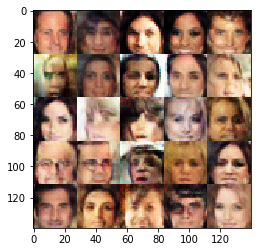

Epoch 1/1... Discriminator Loss: 0.6059... Generator Loss: 1.2224
Epoch 1/1... Discriminator Loss: 0.8074... Generator Loss: 1.1176
Epoch 1/1... Discriminator Loss: 1.3626... Generator Loss: 0.7566
Epoch 1/1... Discriminator Loss: 1.2661... Generator Loss: 0.4911
Epoch 1/1... Discriminator Loss: 1.0205... Generator Loss: 0.6251


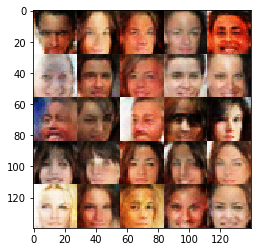

Epoch 1/1... Discriminator Loss: 0.6268... Generator Loss: 2.4146
Epoch 1/1... Discriminator Loss: 0.9758... Generator Loss: 0.7439
Epoch 1/1... Discriminator Loss: 0.6731... Generator Loss: 1.5225
Epoch 1/1... Discriminator Loss: 1.3331... Generator Loss: 0.3877
Epoch 1/1... Discriminator Loss: 1.5129... Generator Loss: 0.4477


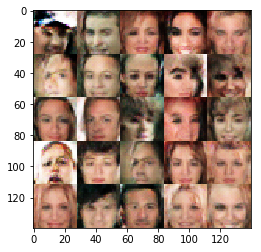

Epoch 1/1... Discriminator Loss: 1.2650... Generator Loss: 0.5596
Epoch 1/1... Discriminator Loss: 0.8515... Generator Loss: 1.2004
Epoch 1/1... Discriminator Loss: 2.0517... Generator Loss: 0.2705
Epoch 1/1... Discriminator Loss: 0.9102... Generator Loss: 0.7931
Epoch 1/1... Discriminator Loss: 1.3188... Generator Loss: 0.5969


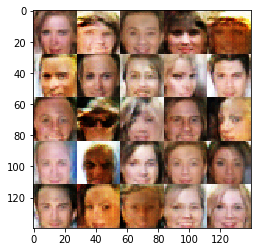

Epoch 1/1... Discriminator Loss: 2.1680... Generator Loss: 0.2636
Epoch 1/1... Discriminator Loss: 0.8458... Generator Loss: 2.6683
Epoch 1/1... Discriminator Loss: 2.5295... Generator Loss: 0.1690
Epoch 1/1... Discriminator Loss: 0.9177... Generator Loss: 1.0455
Epoch 1/1... Discriminator Loss: 1.8102... Generator Loss: 0.3890


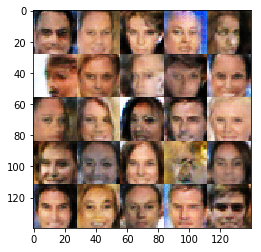

Epoch 1/1... Discriminator Loss: 1.0441... Generator Loss: 0.8299
Epoch 1/1... Discriminator Loss: 0.5081... Generator Loss: 1.5359
Epoch 1/1... Discriminator Loss: 1.1812... Generator Loss: 0.5331
Epoch 1/1... Discriminator Loss: 0.8805... Generator Loss: 0.8818
Epoch 1/1... Discriminator Loss: 2.6947... Generator Loss: 0.1013


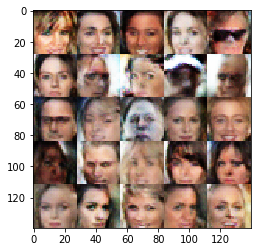

Epoch 1/1... Discriminator Loss: 1.5022... Generator Loss: 0.4300
Epoch 1/1... Discriminator Loss: 1.6279... Generator Loss: 0.4201
Epoch 1/1... Discriminator Loss: 1.8301... Generator Loss: 0.3426
Epoch 1/1... Discriminator Loss: 2.2996... Generator Loss: 0.3075
Epoch 1/1... Discriminator Loss: 1.2154... Generator Loss: 0.7635


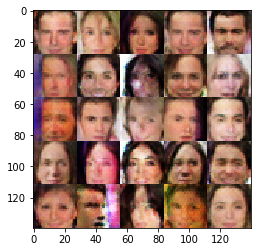

Epoch 1/1... Discriminator Loss: 1.1205... Generator Loss: 0.7014
Epoch 1/1... Discriminator Loss: 1.4917... Generator Loss: 0.4146
Epoch 1/1... Discriminator Loss: 1.2824... Generator Loss: 0.5776
Epoch 1/1... Discriminator Loss: 2.0813... Generator Loss: 0.2483
Epoch 1/1... Discriminator Loss: 0.7198... Generator Loss: 1.2271


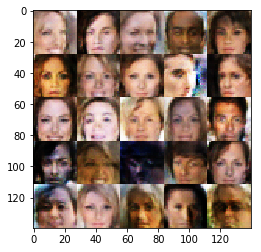

Epoch 1/1... Discriminator Loss: 0.6565... Generator Loss: 1.1179
Epoch 1/1... Discriminator Loss: 0.8790... Generator Loss: 0.8274
Epoch 1/1... Discriminator Loss: 0.7609... Generator Loss: 1.1431
Epoch 1/1... Discriminator Loss: 1.3563... Generator Loss: 0.5632
Epoch 1/1... Discriminator Loss: 0.8194... Generator Loss: 0.9005


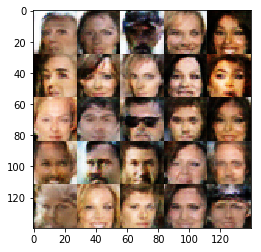

Epoch 1/1... Discriminator Loss: 0.9394... Generator Loss: 0.8201
Epoch 1/1... Discriminator Loss: 0.7798... Generator Loss: 1.0350
Epoch 1/1... Discriminator Loss: 0.8651... Generator Loss: 0.9640
Epoch 1/1... Discriminator Loss: 1.0396... Generator Loss: 0.8534
Epoch 1/1... Discriminator Loss: 0.6148... Generator Loss: 1.1885


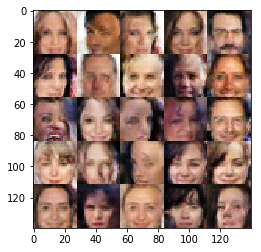

Epoch 1/1... Discriminator Loss: 0.5904... Generator Loss: 1.3152
Epoch 1/1... Discriminator Loss: 0.8317... Generator Loss: 0.9646
Epoch 1/1... Discriminator Loss: 1.4812... Generator Loss: 0.4785
Epoch 1/1... Discriminator Loss: 0.6474... Generator Loss: 1.6562
Epoch 1/1... Discriminator Loss: 1.5147... Generator Loss: 0.4881


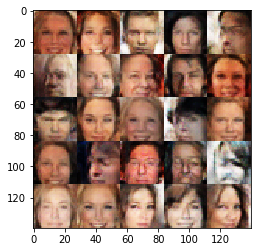

Epoch 1/1... Discriminator Loss: 0.5047... Generator Loss: 1.5122
Epoch 1/1... Discriminator Loss: 0.6719... Generator Loss: 1.0072
Epoch 1/1... Discriminator Loss: 0.5493... Generator Loss: 1.4729
Epoch 1/1... Discriminator Loss: 0.7365... Generator Loss: 1.0028
Epoch 1/1... Discriminator Loss: 1.5907... Generator Loss: 0.4733


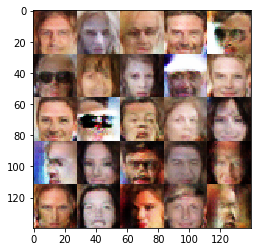

Epoch 1/1... Discriminator Loss: 1.9564... Generator Loss: 0.4278
Epoch 1/1... Discriminator Loss: 0.9006... Generator Loss: 0.7485
Epoch 1/1... Discriminator Loss: 0.8467... Generator Loss: 3.1586
Epoch 1/1... Discriminator Loss: 1.2691... Generator Loss: 0.5580
Epoch 1/1... Discriminator Loss: 1.0676... Generator Loss: 0.6555


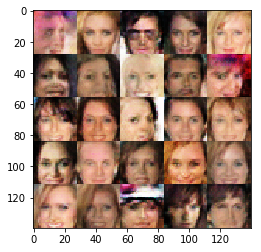

Epoch 1/1... Discriminator Loss: 1.0857... Generator Loss: 0.6029
Epoch 1/1... Discriminator Loss: 1.8596... Generator Loss: 0.2928
Epoch 1/1... Discriminator Loss: 1.4286... Generator Loss: 0.4332
Epoch 1/1... Discriminator Loss: 0.7405... Generator Loss: 1.1273
Epoch 1/1... Discriminator Loss: 1.3074... Generator Loss: 0.5451


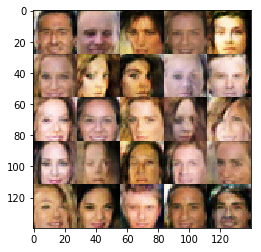

Epoch 1/1... Discriminator Loss: 1.7416... Generator Loss: 0.5093
Epoch 1/1... Discriminator Loss: 1.4546... Generator Loss: 0.5683
Epoch 1/1... Discriminator Loss: 1.3600... Generator Loss: 0.5420
Epoch 1/1... Discriminator Loss: 0.9915... Generator Loss: 0.7422
Epoch 1/1... Discriminator Loss: 1.1443... Generator Loss: 0.6341


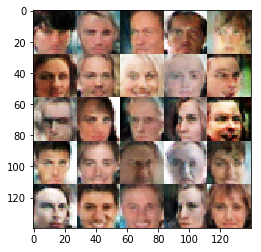

Epoch 1/1... Discriminator Loss: 1.7303... Generator Loss: 0.3352
Epoch 1/1... Discriminator Loss: 1.4945... Generator Loss: 0.4255
Epoch 1/1... Discriminator Loss: 1.4009... Generator Loss: 0.6019
Epoch 1/1... Discriminator Loss: 0.8772... Generator Loss: 1.0552
Epoch 1/1... Discriminator Loss: 0.5410... Generator Loss: 1.6902


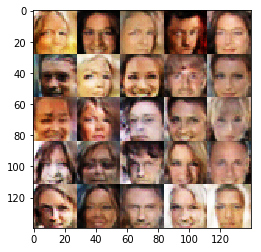

Epoch 1/1... Discriminator Loss: 1.5669... Generator Loss: 0.4822
Epoch 1/1... Discriminator Loss: 1.5822... Generator Loss: 0.4299
Epoch 1/1... Discriminator Loss: 1.5862... Generator Loss: 0.4027
Epoch 1/1... Discriminator Loss: 0.3909... Generator Loss: 1.9281
Epoch 1/1... Discriminator Loss: 0.6669... Generator Loss: 1.8151


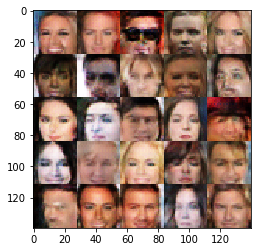

Epoch 1/1... Discriminator Loss: 1.5146... Generator Loss: 0.5449
Epoch 1/1... Discriminator Loss: 0.5322... Generator Loss: 2.7285
Epoch 1/1... Discriminator Loss: 0.6099... Generator Loss: 1.3591
Epoch 1/1... Discriminator Loss: 1.1508... Generator Loss: 0.6338
Epoch 1/1... Discriminator Loss: 1.0658... Generator Loss: 0.6152


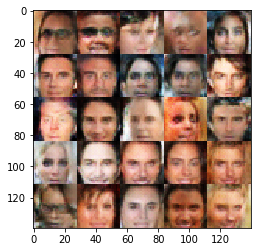

Epoch 1/1... Discriminator Loss: 1.4570... Generator Loss: 0.5982
Epoch 1/1... Discriminator Loss: 1.0681... Generator Loss: 0.8129
Epoch 1/1... Discriminator Loss: 1.9158... Generator Loss: 0.2844
Epoch 1/1... Discriminator Loss: 1.6598... Generator Loss: 0.3796
Epoch 1/1... Discriminator Loss: 1.6710... Generator Loss: 0.5163


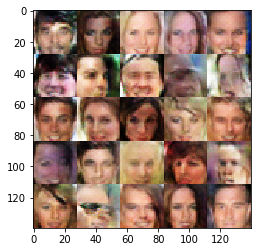

Epoch 1/1... Discriminator Loss: 1.1035... Generator Loss: 0.6475
Epoch 1/1... Discriminator Loss: 1.6697... Generator Loss: 0.3569
Epoch 1/1... Discriminator Loss: 1.0483... Generator Loss: 0.8071
Epoch 1/1... Discriminator Loss: 2.5054... Generator Loss: 0.2720
Epoch 1/1... Discriminator Loss: 1.1345... Generator Loss: 0.6196


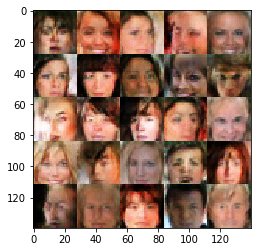

Epoch 1/1... Discriminator Loss: 0.6411... Generator Loss: 1.3575
Epoch 1/1... Discriminator Loss: 1.3794... Generator Loss: 0.5590
Epoch 1/1... Discriminator Loss: 0.5662... Generator Loss: 1.5700
Epoch 1/1... Discriminator Loss: 0.9277... Generator Loss: 0.8015
Epoch 1/1... Discriminator Loss: 0.4984... Generator Loss: 2.0217


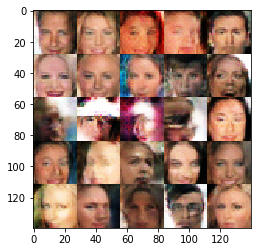

Epoch 1/1... Discriminator Loss: 1.2116... Generator Loss: 0.7020
Epoch 1/1... Discriminator Loss: 0.6090... Generator Loss: 1.1835
Epoch 1/1... Discriminator Loss: 2.9813... Generator Loss: 0.0991
Epoch 1/1... Discriminator Loss: 0.9708... Generator Loss: 0.7773
Epoch 1/1... Discriminator Loss: 1.7870... Generator Loss: 0.2944


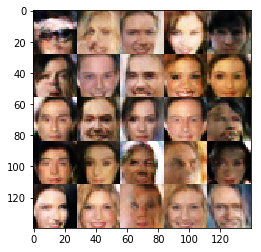

Epoch 1/1... Discriminator Loss: 0.7791... Generator Loss: 1.0794
Epoch 1/1... Discriminator Loss: 0.4694... Generator Loss: 1.8364
Epoch 1/1... Discriminator Loss: 0.7345... Generator Loss: 0.9913
Epoch 1/1... Discriminator Loss: 1.5525... Generator Loss: 0.3994
Epoch 1/1... Discriminator Loss: 0.7065... Generator Loss: 1.1286


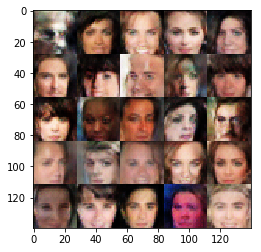

Epoch 1/1... Discriminator Loss: 0.4756... Generator Loss: 1.5017
Epoch 1/1... Discriminator Loss: 0.8589... Generator Loss: 0.9965
Epoch 1/1... Discriminator Loss: 1.6300... Generator Loss: 0.3369
Epoch 1/1... Discriminator Loss: 0.8442... Generator Loss: 1.0680
Epoch 1/1... Discriminator Loss: 0.6349... Generator Loss: 1.4759


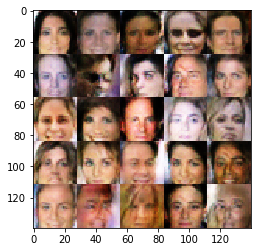

Epoch 1/1... Discriminator Loss: 1.7762... Generator Loss: 0.3020
Epoch 1/1... Discriminator Loss: 0.9955... Generator Loss: 2.8378
Epoch 1/1... Discriminator Loss: 1.2275... Generator Loss: 0.7799
Epoch 1/1... Discriminator Loss: 0.9217... Generator Loss: 0.7374
Epoch 1/1... Discriminator Loss: 0.7959... Generator Loss: 1.5106


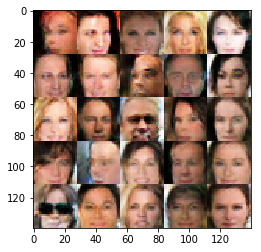

Epoch 1/1... Discriminator Loss: 0.8851... Generator Loss: 0.8442
Epoch 1/1... Discriminator Loss: 2.0971... Generator Loss: 0.2462
Epoch 1/1... Discriminator Loss: 1.1680... Generator Loss: 0.9201
Epoch 1/1... Discriminator Loss: 0.5955... Generator Loss: 1.6943
Epoch 1/1... Discriminator Loss: 1.5782... Generator Loss: 0.4724


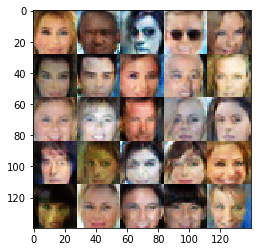

Epoch 1/1... Discriminator Loss: 1.4017... Generator Loss: 0.5452
Epoch 1/1... Discriminator Loss: 1.3599... Generator Loss: 0.4633
Epoch 1/1... Discriminator Loss: 0.8152... Generator Loss: 1.1036
Epoch 1/1... Discriminator Loss: 0.7469... Generator Loss: 2.3011
Epoch 1/1... Discriminator Loss: 0.5592... Generator Loss: 1.1460


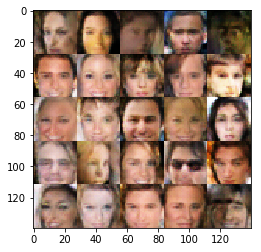

Epoch 1/1... Discriminator Loss: 2.0620... Generator Loss: 0.3047
Epoch 1/1... Discriminator Loss: 0.5303... Generator Loss: 1.5810
Epoch 1/1... Discriminator Loss: 1.3575... Generator Loss: 0.5442
Epoch 1/1... Discriminator Loss: 1.6448... Generator Loss: 0.3570
Epoch 1/1... Discriminator Loss: 0.9514... Generator Loss: 0.9170


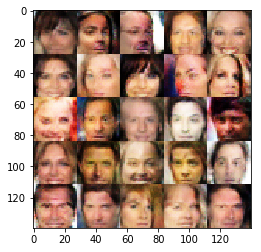

Epoch 1/1... Discriminator Loss: 2.3366... Generator Loss: 0.3224
Epoch 1/1... Discriminator Loss: 1.1318... Generator Loss: 0.6755
Epoch 1/1... Discriminator Loss: 0.6924... Generator Loss: 2.7656


ValueError: Parent directory of ./ckpts/generator.ckpt doesn't exist, can't save.

In [142]:
batch_size = 28
z_dim = 128
learning_rate = 0.001
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.